EDA of Bike sharing compony

In [1]:
import numpy as np
import pandas as pd
df1=pd.read_csv('hour.csv')
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     17379 non-null  int64  
 1   dteday      17379 non-null  object 
 2   season      17379 non-null  int64  
 3   yr          17379 non-null  int64  
 4   mnth        17379 non-null  int64  
 5   hr          17379 non-null  int64  
 6   holiday     17379 non-null  int64  
 7   weekday     17379 non-null  int64  
 8   workingday  17379 non-null  int64  
 9   weathersit  17379 non-null  int64  
 10  temp        17379 non-null  float64
 11  atemp       17379 non-null  float64
 12  hum         17379 non-null  float64
 13  windspeed   17379 non-null  float64
 14  casual      17379 non-null  int64  
 15  registered  17379 non-null  int64  
 16  cnt         17379 non-null  int64  
dtypes: float64(4), int64(12), object(1)
memory usage: 2.3+ MB


In [2]:
df1

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0000,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0000,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0000,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0000,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0000,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17374,17375,2012-12-31,1,1,12,19,0,1,1,2,0.26,0.2576,0.60,0.1642,11,108,119
17375,17376,2012-12-31,1,1,12,20,0,1,1,2,0.26,0.2576,0.60,0.1642,8,81,89
17376,17377,2012-12-31,1,1,12,21,0,1,1,1,0.26,0.2576,0.60,0.1642,7,83,90
17377,17378,2012-12-31,1,1,12,22,0,1,1,1,0.26,0.2727,0.56,0.1343,13,48,61


In [3]:
df1['dteday']=pd.to_datetime(df1['dteday'])

df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   instant     17379 non-null  int64         
 1   dteday      17379 non-null  datetime64[ns]
 2   season      17379 non-null  int64         
 3   yr          17379 non-null  int64         
 4   mnth        17379 non-null  int64         
 5   hr          17379 non-null  int64         
 6   holiday     17379 non-null  int64         
 7   weekday     17379 non-null  int64         
 8   workingday  17379 non-null  int64         
 9   weathersit  17379 non-null  int64         
 10  temp        17379 non-null  float64       
 11  atemp       17379 non-null  float64       
 12  hum         17379 non-null  float64       
 13  windspeed   17379 non-null  float64       
 14  casual      17379 non-null  int64         
 15  registered  17379 non-null  int64         
 16  cnt         17379 non-

Plot correlation matrix

/var/folders/nm/btrww2_94pncl34mb0yt49j80000gn/T/ipykernel_99258/345592824.py:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  mask = np.triu(np.ones_like(df1.corr(), dtype=np.bool))
/var/folders/nm/btrww2_94pncl34mb0yt49j80000gn/T/ipykernel_99258/345592824.py:4: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.triu(np.ones_like(df1.corr(), dtype=np.bool))
/var/folders/nm/btrww2_94pncl34mb0yt49j80000gn/T/ipykernel_99258/345592824.py:6: FutureWarning: The default value of numeric_only in Dat

<AxesSubplot: >

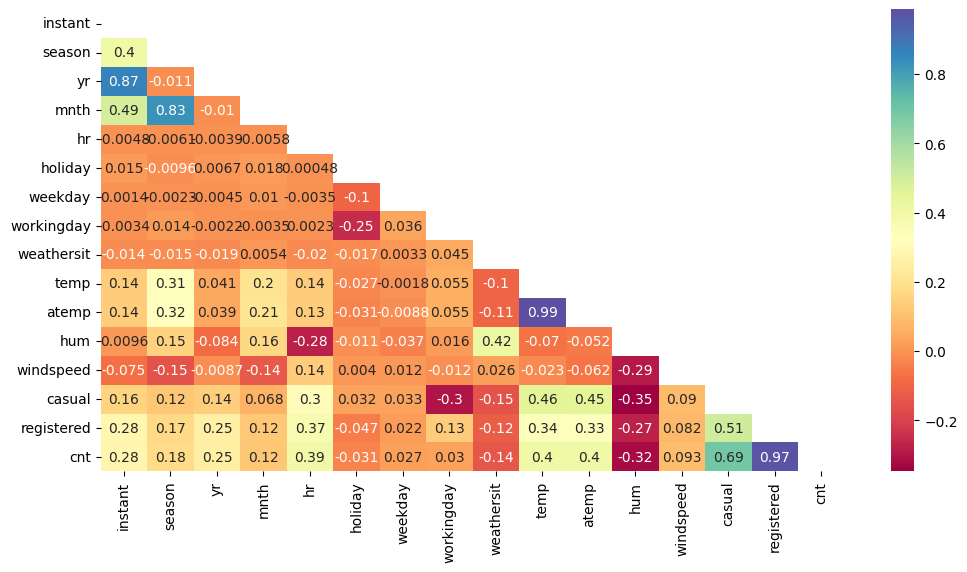

In [4]:
import seaborn as sns
import matplotlib.pyplot as plt
fig=plt.figure(figsize=(12,6))
mask = np.triu(np.ones_like(df1.corr(), dtype=np.bool))

sns.heatmap(df1.corr(),cmap='Spectral', mask=mask , annot=True)


Convert some Features to categorical Features to ease the EDA

In [5]:
df1.loc[df1['season'] ==1,'season']='Winter'
df1.loc[df1['season'] ==2,'season']='Spring'
df1.loc[df1['season'] ==3,'season']= 'Summer'
df1.loc[df1['season'] ==4,'season']= 'Fall'
df1.loc[df1['holiday'] ==0, 'holiday'] ='No'
df1.loc[df1['holiday'] ==1, 'holiday'] ='Yes'
df1.loc[df1['weathersit']==1,'weathersit']='Clear'
df1.loc[df1['weathersit']==2,'weathersit']='Mist'
df1.loc[df1['weathersit']==3,'weathersit']='Light rain'
df1.loc[df1['weathersit']==4,'weathersit']='Heavy rain'
df1['season']=pd.Categorical(df1['season'], categories=['Winter','Spring','Summer','Fall'])
df1['holiday']=pd.Categorical(df1['holiday'], categories=['No','Yes'])
df1['weathersit']=pd.Categorical(df1['weathersit'], categories=['Clear','Mist','Light rain','Heavy rain'])

df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   instant     17379 non-null  int64         
 1   dteday      17379 non-null  datetime64[ns]
 2   season      17379 non-null  category      
 3   yr          17379 non-null  int64         
 4   mnth        17379 non-null  int64         
 5   hr          17379 non-null  int64         
 6   holiday     17379 non-null  category      
 7   weekday     17379 non-null  int64         
 8   workingday  17379 non-null  int64         
 9   weathersit  17379 non-null  category      
 10  temp        17379 non-null  float64       
 11  atemp       17379 non-null  float64       
 12  hum         17379 non-null  float64       
 13  windspeed   17379 non-null  float64       
 14  casual      17379 non-null  int64         
 15  registered  17379 non-null  int64         
 16  cnt         17379 non-

In [6]:
df1['is_weekend']=np.where((df1['workingday'] == 0), 'Yes', 'No')


In [7]:
df1.describe()

,instant,yr,mnth,hr,weekday,workingday,temp,atemp,hum,windspeed,casual,registered,cnt
count,17379.0000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000
mean,8690.0000,0.502561,6.537775,11.546752,3.003683,0.682721,0.496987,0.475775,0.627229,0.190098,35.676218,153.786869,189.463088
std,5017.0295,0.500008,3.438776,6.914405,2.005771,0.465431,0.192556,0.171850,0.192930,0.122340,49.305030,151.357286,181.387599
min,1.0000,0.000000,1.000000,0.000000,0.000000,0.000000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,4345.5000,0.000000,4.000000,6.000000,1.000000,0.000000,0.340000,0.333300,0.480000,0.104500,4.000000,34.000000,40.000000
50%,8690.0000,1.000000,7.000000,12.000000,3.000000,1.000000,0.500000,0.484800,0.630000,0.194000,17.000000,115.000000,142.000000
75%,13034.5000,1.000000,10.000000,18.000000,5.000000,1.000000,0.660000,0.621200,0.780000,0.253700,48.000000,220.000000,281.000000
max,17379.0000,1.000000,12.000000,23.000000,6.000000,1.000000,1.000000,1.000000,1.000000,0.850700,367.000000,886.000000,977.000000


Converting temp and etemp to the real Temperature. Temp and atemp are calculated by the following equation: 
temp= (t-t_min)/(t_max-t_min), t_min=-8, t_max=+30
atemp=(t-t_min)/(t_max-t_min), t_min=-16, t_max=+50 

In [8]:
t_max_t=39
t_min_t=-8
t_max_ta=50
t_min_ta=-16
df1['real_temp']=(df1['temp']*(t_max_t-t_min_t))+t_min_t
df1['real_atemp']=(df1['atemp']*(t_max_ta-t_min_ta))+t_min_ta
df1['real_hum']=df1['hum']*100
df1['real_windspeed']=df1['windspeed']*67
df1.describe()

,instant,yr,mnth,hr,weekday,workingday,temp,atemp,hum,windspeed,casual,registered,cnt,real_temp,real_atemp,real_hum,real_windspeed
count,17379.0000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000
mean,8690.0000,0.502561,6.537775,11.546752,3.003683,0.682721,0.496987,0.475775,0.627229,0.190098,35.676218,153.786869,189.463088,15.358397,15.401157,62.722884,12.736540
std,5017.0295,0.500008,3.438776,6.914405,2.005771,0.465431,0.192556,0.171850,0.192930,0.122340,49.305030,151.357286,181.387599,9.050138,11.342114,19.292983,8.196795
min,1.0000,0.000000,1.000000,0.000000,0.000000,0.000000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,-7.060000,-16.000000,0.000000,0.000000
25%,4345.5000,0.000000,4.000000,6.000000,1.000000,0.000000,0.340000,0.333300,0.480000,0.104500,4.000000,34.000000,40.000000,7.980000,5.997800,48.000000,7.001500
50%,8690.0000,1.000000,7.000000,12.000000,3.000000,1.000000,0.500000,0.484800,0.630000,0.194000,17.000000,115.000000,142.000000,15.500000,15.996800,63.000000,12.998000
75%,13034.5000,1.000000,10.000000,18.000000,5.000000,1.000000,0.660000,0.621200,0.780000,0.253700,48.000000,220.000000,281.000000,23.020000,24.999200,78.000000,16.997900
max,17379.0000,1.000000,12.000000,23.000000,6.000000,1.000000,1.000000,1.000000,1.000000,0.850700,367.000000,886.000000,977.000000,39.000000,50.000000,100.000000,56.996900


Creating some new Features

In [9]:
df1['windy_day']=np.where(df1['real_windspeed'] > 30, 'yes', 'no')
df1['hot_day']=np.where(df1['real_atemp'] > 36, 'yes', 'no')
df1['high_hum']=np.where(df1['real_hum'] > 60, 'yes', 'no')


In [10]:
df1['windy_day']=pd.Categorical(df1['windy_day'], categories=['yes','no'])
df1['hot_day']=pd.Categorical(df1['hot_day'], categories=['yes','no'])
df1['high_hum']=pd.Categorical(df1['high_hum'], categories=['yes','no'])
df1['month']=pd.DatetimeIndex(df1['dteday']).month
df1['year']=[d.year for d in df1.dteday]


df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 27 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   instant         17379 non-null  int64         
 1   dteday          17379 non-null  datetime64[ns]
 2   season          17379 non-null  category      
 3   yr              17379 non-null  int64         
 4   mnth            17379 non-null  int64         
 5   hr              17379 non-null  int64         
 6   holiday         17379 non-null  category      
 7   weekday         17379 non-null  int64         
 8   workingday      17379 non-null  int64         
 9   weathersit      17379 non-null  category      
 10  temp            17379 non-null  float64       
 11  atemp           17379 non-null  float64       
 12  hum             17379 non-null  float64       
 13  windspeed       17379 non-null  float64       
 14  casual          17379 non-null  int64         
 15  re

In [11]:
df1.columns

Index(['instant', 'dteday', 'season', 'yr', 'mnth', 'hr', 'holiday', 'weekday',
       'workingday', 'weathersit', 'temp', 'atemp', 'hum', 'windspeed',
       'casual', 'registered', 'cnt', 'is_weekend', 'real_temp', 'real_atemp',
       'real_hum', 'real_windspeed', 'windy_day', 'hot_day', 'high_hum',
       'month', 'year'],
      dtype='object')

Start of ploting 

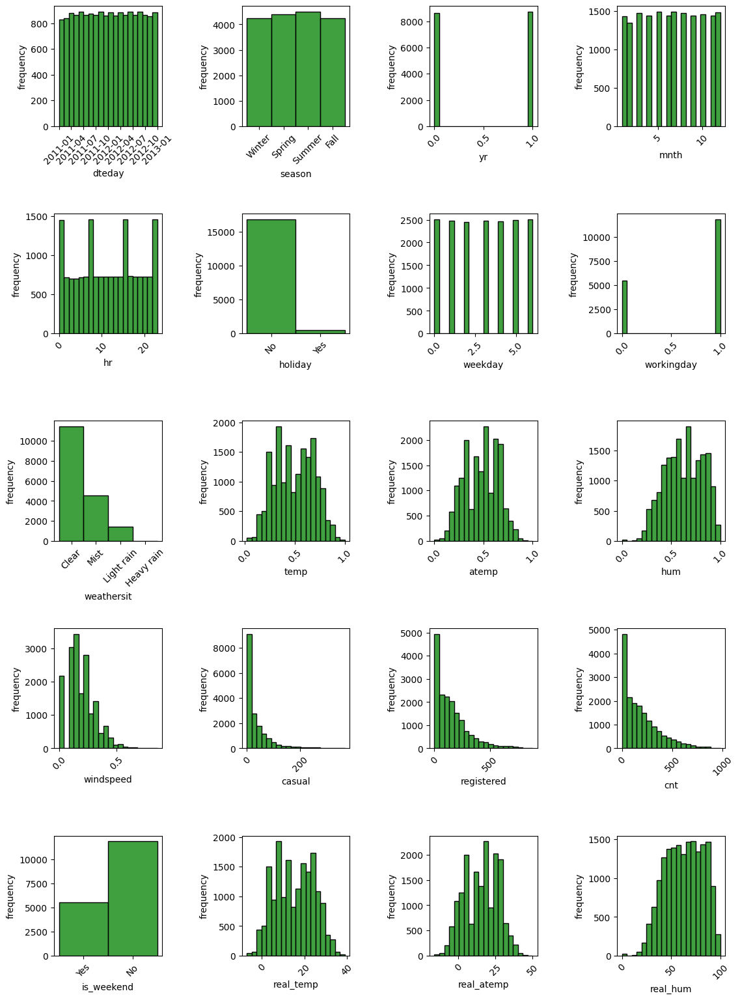

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

nrow = 5
ncolum=4
count=1
fig=plt.figure(figsize=(12,16))
for i in range(nrow):
    for j in range(ncolum):
        plt.subplot2grid((nrow,ncolum), (i,j))
        sns.histplot(df1[df1.columns[count]], bins=20, color='green',  edgecolor='black', linewidth=1.0)
        plt.ylabel('frequency')
        plt.xticks(rotation=45)
        count +=1

plt.tight_layout(pad=3)

Plot of season wise hourly distribution of bike rentals

([<matplotlib.axis.XTick at 0x125dcb490>,
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(7, 0, '7'),
  Text(8, 0, '8'),
  Text(9, 0, '9'),
  Text(10, 0, '10'),
  Text(11, 0, '11'),
  Text(12, 0, '12'),
  Text(13, 0, '13'),
  Text(14, 0, '14'),
  Text(15, 0, '15'),
  Text(16, 0, '16'),
  Text(17, 0, '17'),
  Text(18, 0, '18'),
  Text(19, 0, '19'),
  Text(20, 0, '20'),
  Text(21, 0, '21'),
  Text(22, 0, '22'),
  Text(23, 0, '23')])

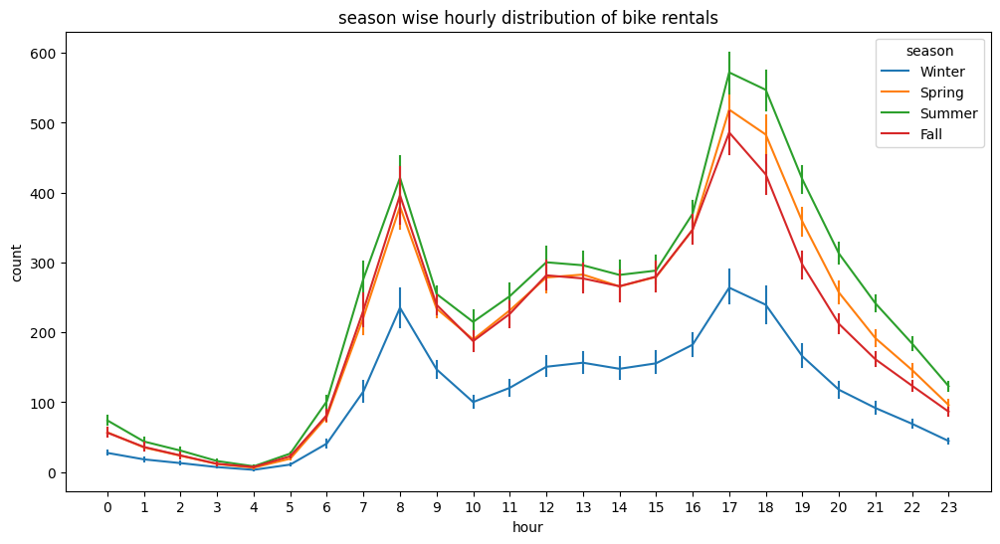

In [13]:

plt.figure(figsize=(12,6))
sns.lineplot(data=df1, x="hr", y="cnt", hue="season", err_style="bars")
plt.title('season wise hourly distribution of bike rentals')
plt.xlabel('hour')
plt.ylabel('count')
plt.xticks(range(0,24))


Plot of "relation between weather and hourly usage of bike rentals"

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/matplotlib/axes/_axes.py:1174: RuntimeWarning: All-NaN axis encountered
  miny = np.nanmin(masked_verts[..., 1])
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/matplotlib/axes/_axes.py:1175: RuntimeWarning: All-NaN axis encountered
  maxy = np.nanmax(masked_verts[..., 1])


([<matplotlib.axis.XTick at 0x125f20340>,
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(7, 0, '7'),
  Text(8, 0, '8'),
  Text(9, 0, '9'),
  Text(10, 0, '10'),
  Text(11, 0, '11'),
  Text(12, 0, '12'),
  Text(13, 0, '13'),
  Text(14, 0, '14'),
  Text(15, 0, '15'),
  Text(16, 0, '16'),
  Text(17, 0, '17'),
  Text(18, 0, '18'),
  Text(19, 0, '19'),
  Text(20, 0, '20'),
  Text(21, 0, '21'),
  Text(22, 0, '22'),
  Text(23, 0, '23')])

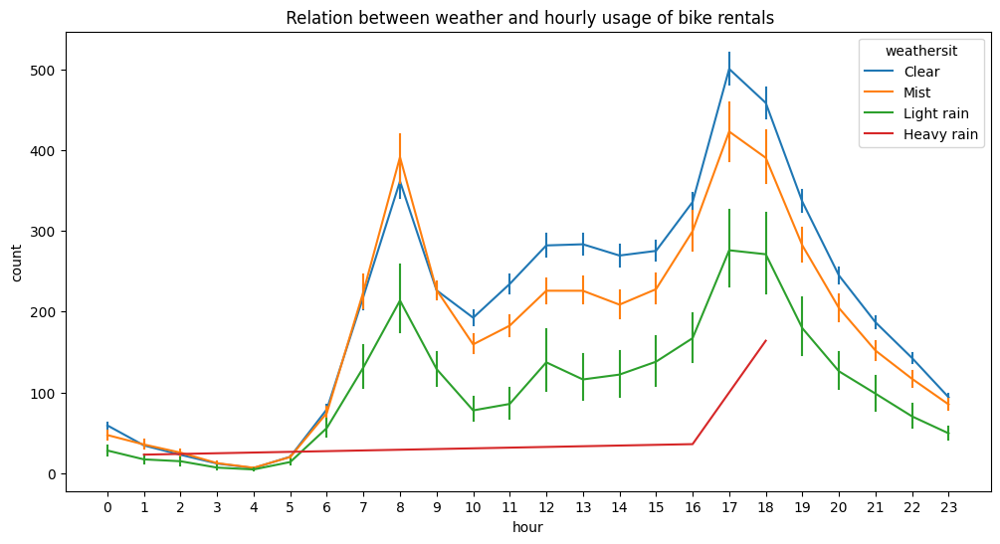

In [14]:
plt.figure(figsize=(12,6))
sns.lineplot(data=df1, x="hr", y="cnt", hue="weathersit", err_style="bars")
plt.title(' Relation between weather and hourly usage of bike rentals')
plt.xlabel('hour')
plt.ylabel('count')
plt.xticks(range(0,24))


Plot of relation of weekend, weekdays, holidays and non-holidays with bike rentals

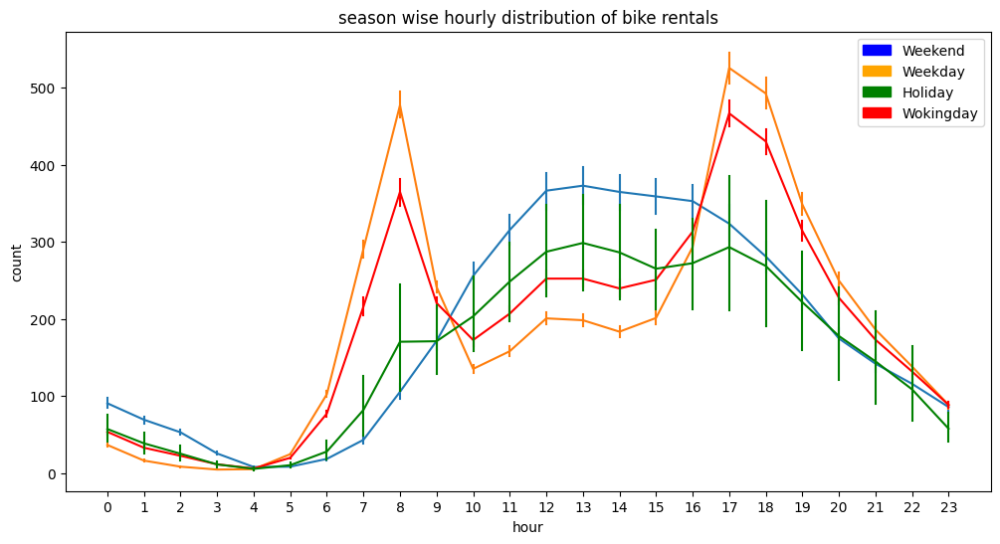

In [15]:
import matplotlib.patches as mpatches 

plt.figure(figsize=(12,6))
sns.lineplot(data=df1, x="hr", y="cnt", hue="is_weekend", err_style="bars")
sns.lineplot(data=df1, x="hr", y="cnt", hue="holiday", err_style="bars",palette=['r', 'g'])

plt.title('season wise hourly distribution of bike rentals')
plt.xlabel('hour')
plt.ylabel('count')
plt.xticks(range(0,24))
p_a=mpatches.Patch(color='blue',label='Weekend')
p_b=mpatches.Patch(color='orange',label='Weekday')
p_c=mpatches.Patch(color='g',label='Holiday')
p_d=mpatches.Patch(color='r',label='Wokingday')

plt.legend(handles=[p_a,p_b,p_c,p_d]) 


Plot of "relation between casual and registered users with bike rentals"

([<matplotlib.axis.XTick at 0x1261b5ed0>,
 [Text(0, 0, '0'),
  Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(7, 0, '7'),
  Text(8, 0, '8'),
  Text(9, 0, '9'),
  Text(10, 0, '10'),
  Text(11, 0, '11'),
  Text(12, 0, '12'),
  Text(13, 0, '13'),
  Text(14, 0, '14'),
  Text(15, 0, '15'),
  Text(16, 0, '16'),
  Text(17, 0, '17'),
  Text(18, 0, '18'),
  Text(19, 0, '19'),
  Text(20, 0, '20'),
  Text(21, 0, '21'),
  Text(22, 0, '22'),
  Text(23, 0, '23')])

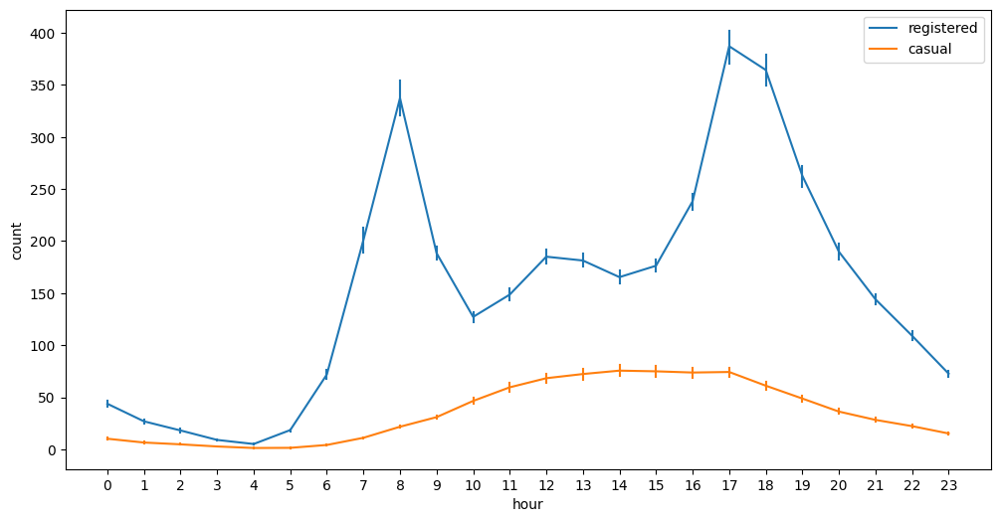

In [16]:
plt.figure(figsize=(12,6))
sns.lineplot(data=df1, x="hr", y="registered", err_style="bars")
sns.lineplot(data=df1, x="hr", y="casual", err_style="bars")
plt.legend(['registered','casual'])
plt.xlabel('hour')
plt.ylabel('count')
plt.xticks(range(0,24))

Plot of relation between hot days with bike rentals

<AxesSubplot: xlabel='hr', ylabel='cnt'>

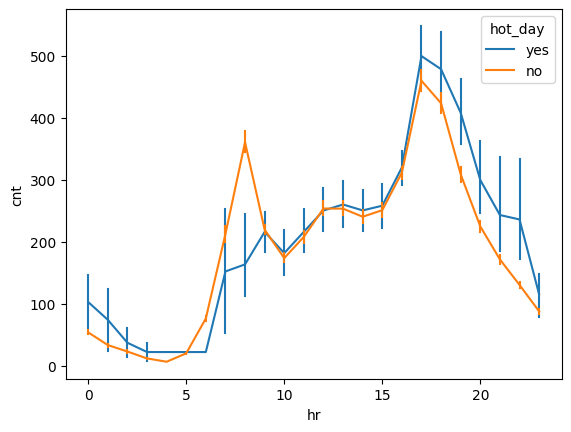

In [17]:
sns.lineplot(data=df1,x='hr',y='cnt',hue='hot_day', err_style="bars")

Plot of relations between high humidity and bike rentals

<AxesSubplot: xlabel='hr', ylabel='cnt'>

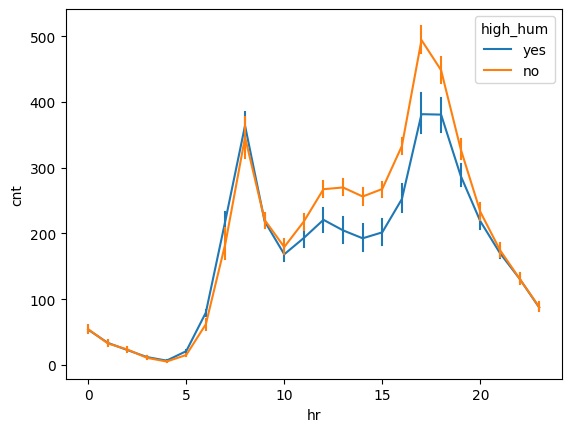

In [18]:
sns.lineplot(data=df1,x='hr',y='cnt',hue='high_hum', err_style="bars")

Plot of relation between temperature, humidity and bike rentals

Text(0, 0.5, 'Number of rented bikes')

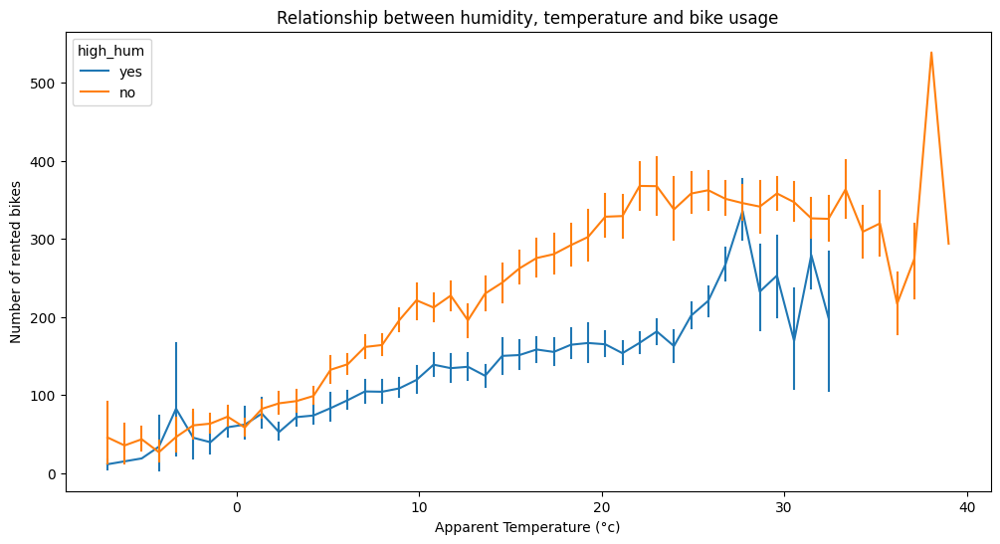

In [19]:
fig=plt.figure(figsize=(12,6))
sns.lineplot(data=df1,x='real_temp',y='cnt',hue='high_hum', err_style="bars")
plt.title('Relationship between humidity, temperature and bike usage')
plt.xlabel('Apparent Temperature (°c)')
plt.ylabel('Number of rented bikes')

Plot of relation between windy days and bike rentals

<AxesSubplot: xlabel='hr', ylabel='cnt'>

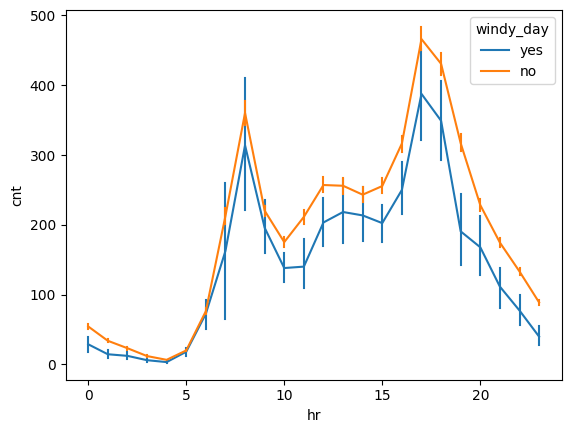

In [20]:
sns.lineplot(data=df1,x='hr',y='cnt',hue='windy_day', err_style="bars")

Plot of relation between windy days with bike rentals in different years 

<AxesSubplot: xlabel='hr', ylabel='cnt'>

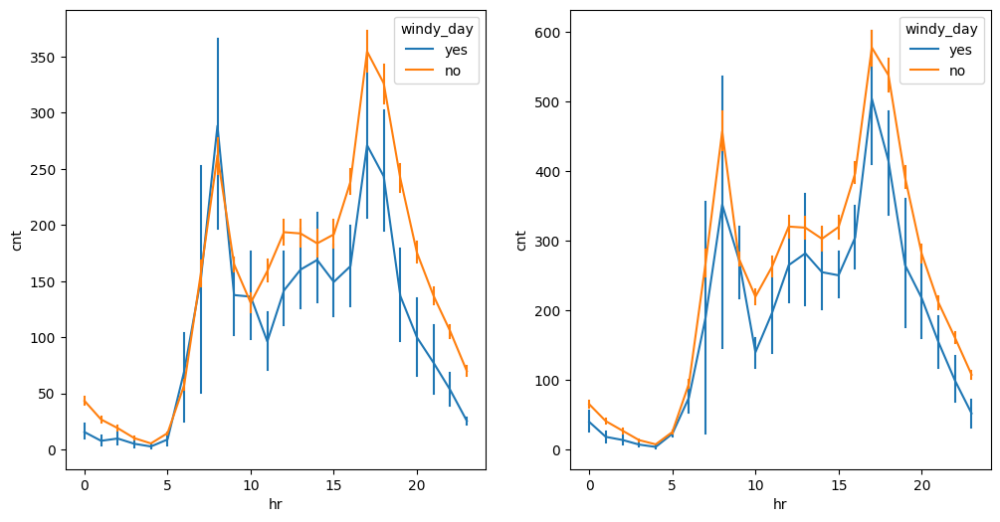

In [21]:
plt.figure(figsize=(12,6))
plt.subplot2grid((1,2),(0,0))
sns.lineplot(data=df1[df1['yr']==0],x='hr',y='cnt',hue='windy_day', err_style="bars")
plt.subplot2grid((1,2),(0,1))
sns.lineplot(data=df1[df1['yr']==1],x='hr',y='cnt',hue='windy_day', err_style="bars")


In [22]:
df1.describe()

,instant,yr,mnth,hr,weekday,workingday,temp,atemp,hum,windspeed,casual,registered,cnt,real_temp,real_atemp,real_hum,real_windspeed,month,year
count,17379.0000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000
mean,8690.0000,0.502561,6.537775,11.546752,3.003683,0.682721,0.496987,0.475775,0.627229,0.190098,35.676218,153.786869,189.463088,15.358397,15.401157,62.722884,12.736540,6.537775,2011.502561
std,5017.0295,0.500008,3.438776,6.914405,2.005771,0.465431,0.192556,0.171850,0.192930,0.122340,49.305030,151.357286,181.387599,9.050138,11.342114,19.292983,8.196795,3.438776,0.500008
min,1.0000,0.000000,1.000000,0.000000,0.000000,0.000000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,-7.060000,-16.000000,0.000000,0.000000,1.000000,2011.000000
25%,4345.5000,0.000000,4.000000,6.000000,1.000000,0.000000,0.340000,0.333300,0.480000,0.104500,4.000000,34.000000,40.000000,7.980000,5.997800,48.000000,7.001500,4.000000,2011.000000
50%,8690.0000,1.000000,7.000000,12.000000,3.000000,1.000000,0.500000,0.484800,0.630000,0.194000,17.000000,115.000000,142.000000,15.500000,15.996800,63.000000,12.998000,7.000000,2012.000000
75%,13034.5000,1.000000,10.000000,18.000000,5.000000,1.000000,0.660000,0.621200,0.780000,0.253700,48.000000,220.000000,281.000000,23.020000,24.999200,78.000000,16.997900,10.000000,2012.000000
max,17379.0000,1.000000,12.000000,23.000000,6.000000,1.000000,1.000000,1.000000,1.000000,0.850700,367.000000,886.000000,977.000000,39.000000,50.000000,100.000000,56.996900,12.000000,2012.000000


Histograms of casual and registered users

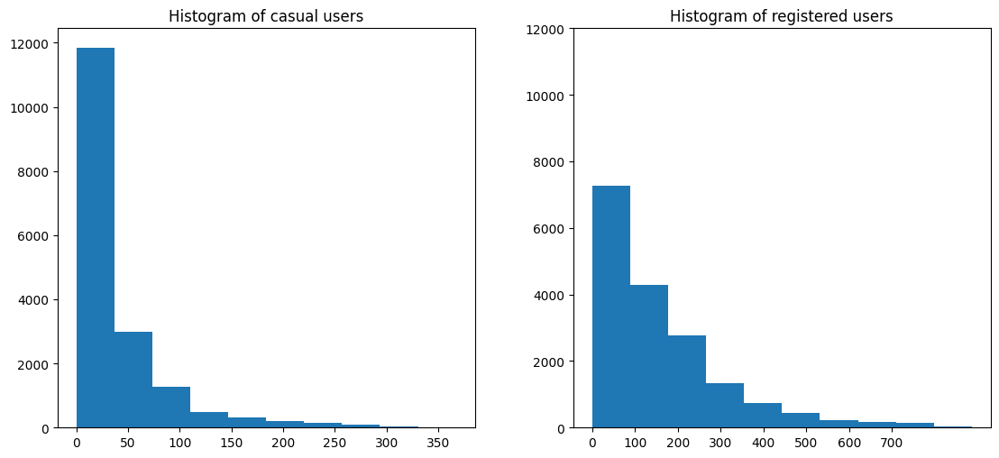

In [23]:
plt.figure(figsize=((12,6)))
plt.subplot2grid((1,2),(0,0))
plt.hist(df1['casual'])
plt.title('Histogram of casual users')
plt.subplot2grid((1,2),(0,1))
plt.title('Histogram of registered users')
plt.xticks(range(0,800,100))
plt.hist(df1['registered'])
plt.ylim(0,12000)
plt.tight_layout(pad=4)

Histogram of montly bike rentals for both years

<AxesSubplot: xlabel='month', ylabel='cnt'>

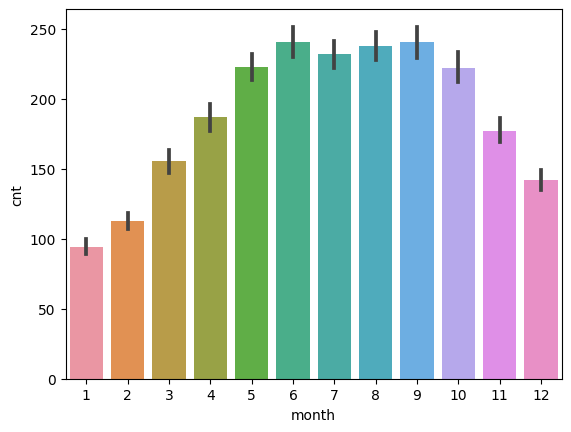

In [24]:
sns.barplot(data=df1, x='month',y='cnt',estimator=np.mean)


In [25]:
df1['cnt'][df1['month']==12].mean()

142.30343897505057

Histogram of montly bike rentals for the first year

<AxesSubplot: xlabel='month', ylabel='cnt'>

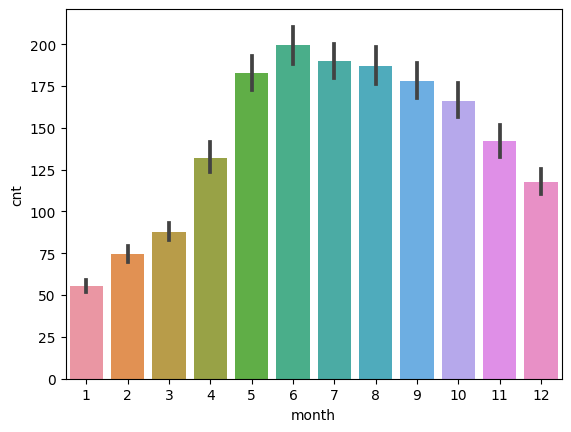

In [26]:
sns.barplot(data=df1[df1['yr']==0], x='month',y='cnt',estimator=np.mean)


Time series of first month of the first year

<AxesSubplot: xlabel='dteday', ylabel='cnt'>

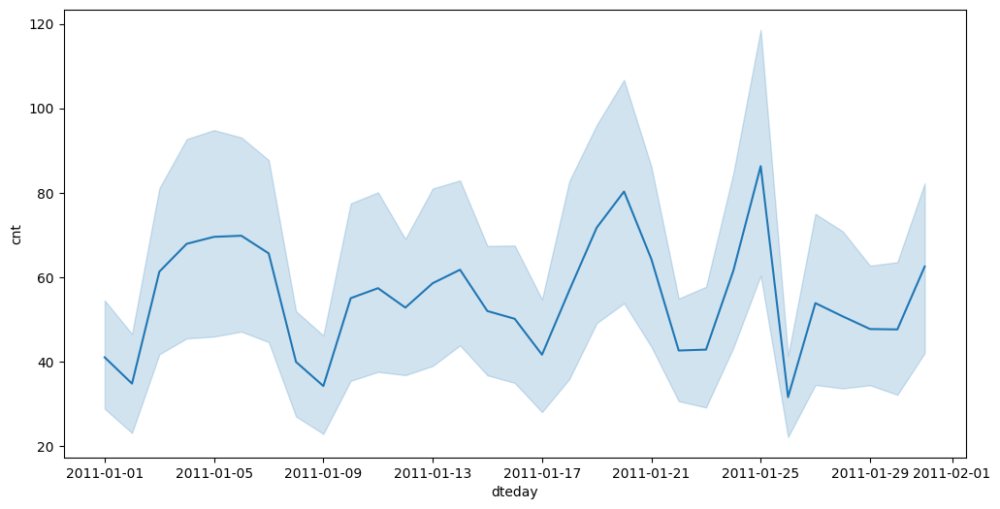

In [27]:
plt.figure(figsize=(12,6))
sns.lineplot(x=df1['dteday'][(df1['yr']==0) & (df1['month']==1)],y=df1['cnt'][(df1['yr']==0) & (df1['month']==1)])

Plot of all data of bike rentals during two years (interactive plot)

In [28]:
import plotly.express as px
fig = px.line(df1,'dteday','cnt')
fig.show()

Plot of all data of bike rentals during two years 

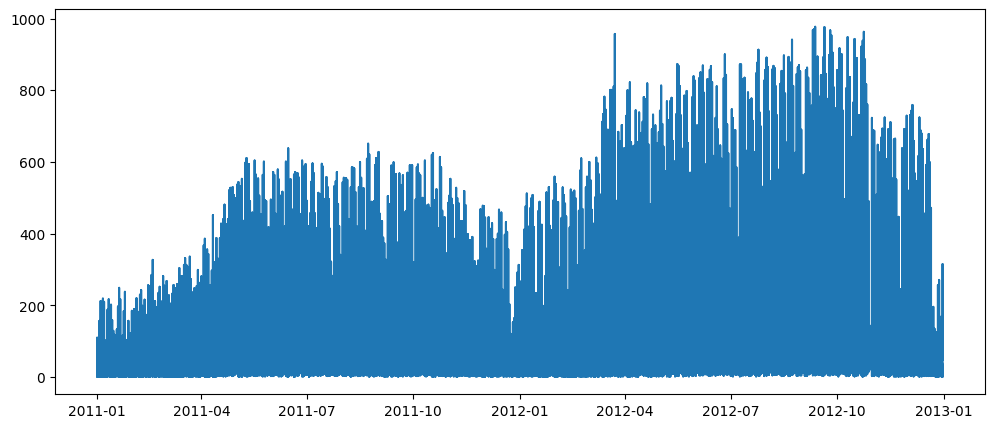

In [29]:
plt.figure(figsize=(12,5))
plt.plot(df1['dteday'],df1['cnt'])

Plot of Daily number of rented bikes for the dates 2012-08-27 and 2012-08-28

Text(0, 0.5, 'Number of rented Bikes')

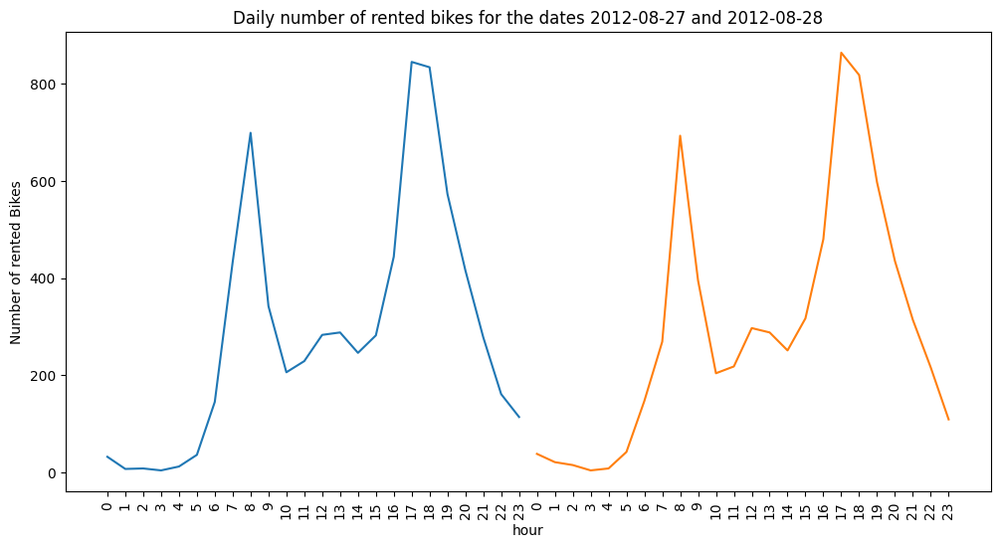

In [30]:
import matplotlib.dates as mdates

fig=plt.figure(figsize=(12,6))
ax=plt.axes()
ax.set_xticks(np.arange(0,48))
ax.set_xticklabels(labels=['0','1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','16','17','18','19','20','21','22','23','0','1','2',
'3','4','5','6','7','8','9','10','11','12','13','14','15','16','17','18','19','20','21','22','23'],rotation = 90)
plt.plot(df1['hr'][(df1['dteday']=='2012-08-27') ],df1['cnt'][(df1['dteday']=='2012-08-27')])
plt.plot(df1['hr'][(df1['dteday']=='2012-08-28') ]+24,df1['cnt'][(df1['dteday']=='2012-08-28')])
plt.title('Daily number of rented bikes for the dates 2012-08-27 and 2012-08-28')
plt.xlabel('hour')
plt.ylabel('Number of rented Bikes')



Selecting some random samples of the dataset (selecting 400 sample out of ~17000 data is not a good choice- it is just for practicing how to select samples).

Text(0.5, 0.5, 'temperature (c°)')

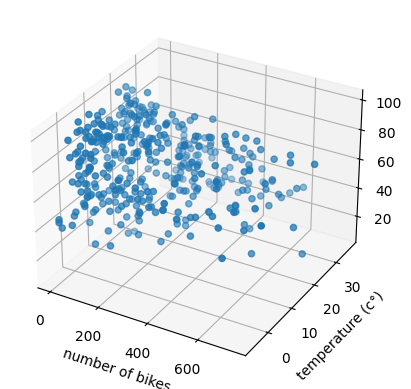

In [31]:
import random
x=df1['cnt']
y=df1['real_temp']
z=df1['real_hum']
hue=df1['real_windspeed']
h1=df1['hr']
h2=df1['weathersit']
h3=df1['season']
h4=df1['registered']
h5=df1['casual']
x_n=[]
y_n=[]
z_n=[]
hue_n=[]
h1_n=[]
h2_n=[]
h3_n=[]
h4_n=[]
h5_n=[]
x1=random.sample(list(zip(x,y,z,hue,h1,h2,h3,h4,h5)), 400)
for i in range(len(x1)):
    x_n.append(x1[i][0])
    y_n.append(x1[i][1])
    z_n.append(x1[i][2])
    hue_n.append(x1[i][3])
    h1_n.append(x1[i][4])
    h2_n.append(x1[i][5])
    h3_n.append(x1[i][6])
    h4_n.append(x1[i][7])
    h5_n.append(x1[i][8])

ax=plt.axes(projection='3d')
ax.scatter3D(x_n,y_n,z_n)
plt.xlabel('number of bikes')
plt.ylabel('temperature (c°)')


Creating arrays  

In [32]:
x1=np.array(x_n)
x2=np.array(y_n)
x3=np.array(z_n)
x4=np.array(hue_n)
x5=np.array(h1_n)
x6=np.array(h2_n)
x7=np.array(h3_n)
x8=np.array(h4_n)
x9=np.array(h5_n)

Creating dataframe based on random samples

In [33]:
df=pd.DataFrame({'cnt': x1, 'real_temp':x2 ,'real_hum': x3,'real_speed': x4, 'hr':x5 , 'weathersit': x6, 'season': x7, 'registered': x8, 'casual': x9})
df

,cnt,real_temp,real_hum,real_speed,hr,weathersit,season,registered,casual
0,362,19.26,83.0,6.0032,7,Clear,Summer,348,14
1,23,-1.42,43.0,15.0013,23,Clear,Winter,23,0
2,86,2.34,55.0,15.0013,10,Mist,Spring,59,27
3,356,28.66,49.0,19.0012,15,Clear,Spring,258,98
4,78,7.04,66.0,12.9980,10,Mist,Winter,56,22
...,...,...,...,...,...,...,...,...,...
395,433,23.02,83.0,0.0000,7,Clear,Summer,418,15
396,2,-5.18,45.0,8.9981,3,Clear,Winter,2,0
397,711,18.32,40.0,0.0000,14,Clear,Fall,376,335
398,284,27.72,62.0,6.0032,22,Clear,Summer,228,56


Plot of relation between temperature, humidity and number of bike rentals

In [34]:
import plotly.express as px
#lables={x_n: "cnt",y_n: "real_temp"}
fig = px.scatter(df1, x='real_hum', y='real_temp', color='cnt', size= 'cnt' , size_max=22, opacity=1, labels={'real_temp':'Temperature (c°)', 'real_hum': 'Humidity (%)','cnt': 'Number of rented bikes'})


fig.show()

In [35]:
import plotly.express as px
#lables={x_n: "cnt",y_n: "real_temp"}
fig = px.scatter(df1, x='real_hum', y='real_temp', color='registered', size= 'registered' , size_max=22, opacity=1, labels={'real_temp':'Temperature (c°)', 'real_hum': 'Humidity (%)','cnt': 'Number of rented bikes'})


fig.show()

In [36]:
import plotly.express as px
#lables={x_n: "cnt",y_n: "real_temp"}
fig = px.scatter(df1, x='real_hum', y='real_temp', color='casual', size= 'casual' , size_max=22, opacity=1, labels={'real_temp':'Temperature (c°)', 'real_hum': 'Humidity (%)','casual': 'Casual'})


fig.show()

Plot of relation between temperature, hour and number of bike rentals for casual users (based on sampled data- as I mentioned before not a good choice)

In [37]:
fig = px.scatter(df, x='hr',y='real_temp',color='casual', size='casual', size_max=18, opacity=1, labels={'real_temp':'Temperature (c°)', 'real_hum': 'Humidity (%)','casual': 'Number of rented bikes'})


fig.show()

Plot of relation between temperature, hour and number of bike rentals for registered users '(based on sampled data- as I mentioned before not a good idea)

In [38]:
fig = px.scatter(df, x='hr',y='real_temp',color='registered', size='registered', size_max=18, opacity=1, labels={'real_temp':'Temperature (c°)', 'hr': 'Hour','registered': 'Registered'})


fig.show()

Like above plot but with the total data

In [39]:
fig = px.scatter(df1, x='hr',y='real_temp',color='registered', size='registered', size_max=18, opacity=1, labels={'hr':'Hour', 'real_temp': 'Temprature (c°)','registered': 'Registered'})
fig.update_layout(
    xaxis = dict(
        tickmode = 'linear',
        tick0 = 0,
        dtick = 2
    )
)

fig.show()

3d interactive plot

In [40]:
import plotly.express as px
#lables={x_n: "cnt",y_n: "real_temp"}
fig = px.scatter_3d(df, x='cnt', y='real_temp', z='real_hum',color='real_speed', size='real_speed', size_max=18, opacity=1)


fig.show()

In [41]:
x1=df1['cnt']
x2=df1['real_temp']
x3=df1['real_hum']

In [42]:
import plotly.graph_objects as go
from scipy.interpolate import griddata

xi = np.linspace(x1.min(), x1.max(), 100)
yi = np.linspace(x2.min(), x2.max(), 100)

X,Y = np.meshgrid(xi,yi)

Z = griddata((x1,x2),x3,(X,Y), method='linear')


#fig=px.scatter_3d(df, x='cnt', y='real_temp', z='real_hum',color='real_speed', size='real_speed', size_max=18, opacity=1)

fig=go.Figure(go.Surface(x=xi,y=yi,z=Z))

fig.show()

Plot of monthly analysis of rental bikes in years 2011 and 2012

Text(0.5, 1.0, 'Monthly analysis of rental bikes in years 2011 and 2012')

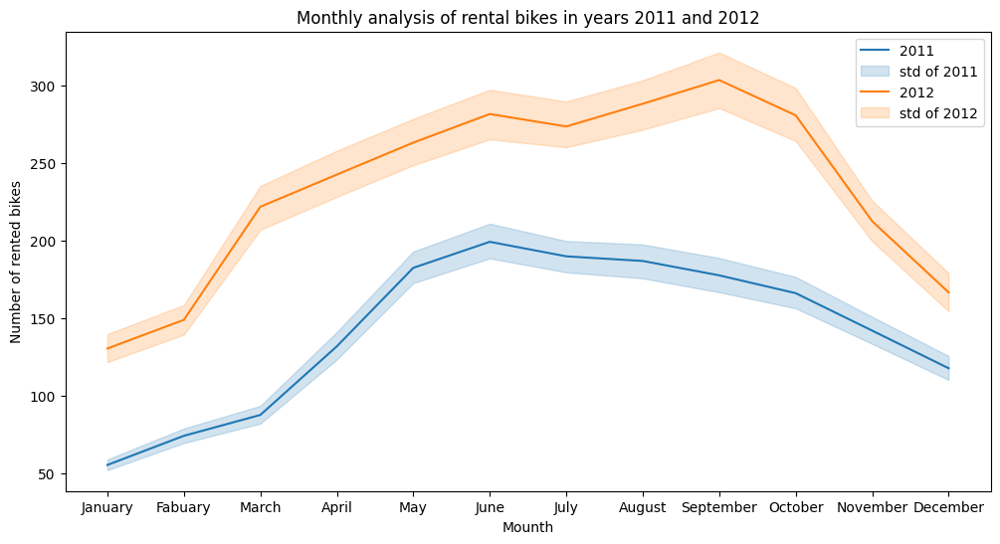

In [43]:
fig=plt.figure(figsize=(12,6))
ax = plt.axes()

l=df1.year.unique()
ax.set_xticks(np.arange(1,13))
ax.set_xticklabels(labels=['January','Fabuary','March','April','May','June','July','August','September','October','November','December'])

for i in range(len(df1.year.unique())):
    sns.lineplot(x=df1['month'][df1['year']==l[i]], y=df1['cnt'][df1['year']==l[i]])



plt.legend(['2011 ','std of 2011','2012','std of 2012'])
plt.xlabel('Mounth')
plt.ylabel('Number of rented bikes')

plt.title('Monthly analysis of rental bikes in years 2011 and 2012')


Plot of monthly analysis of rental bikes for casual users in years 2011 and 2012

Text(0.5, 1.0, 'Monthly analysis of rental bikes for casual users in years 2011 and 2012')

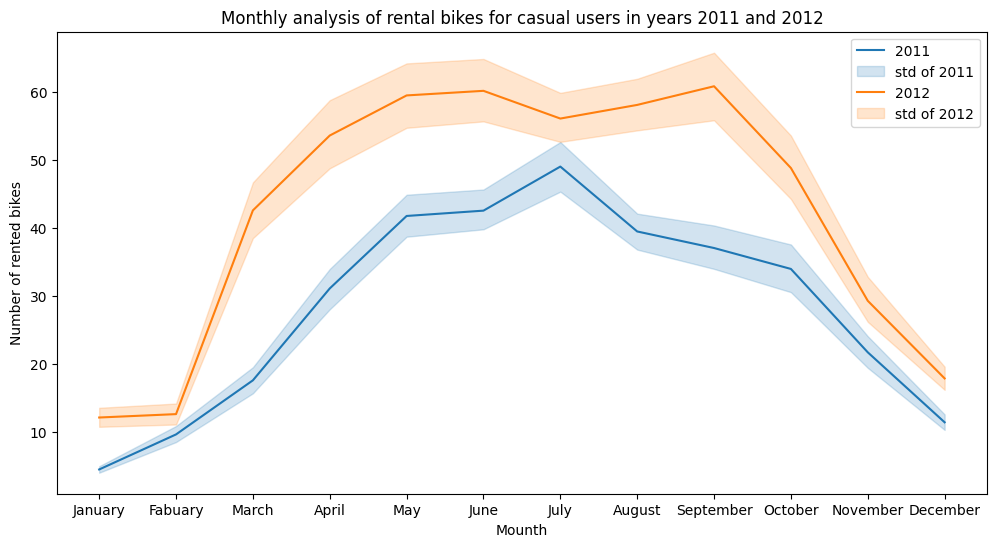

In [44]:
fig=plt.figure(figsize=(12,6))
ax = plt.axes()

l=df1.year.unique()
ax.set_xticks(np.arange(1,13))
ax.set_xticklabels(labels=['January','Fabuary','March','April','May','June','July','August','September','October','November','December'])


for i in range(len(df1.year.unique())):
    sns.lineplot(x=df1['month'][df1['year']==l[i]], y=df1['casual'][df1['year']==l[i]])



plt.legend(['2011 ','std of 2011','2012','std of 2012'])
plt.xlabel('Mounth')
plt.ylabel('Number of rented bikes')
plt.title('Monthly analysis of rental bikes for casual users in years 2011 and 2012')

Plot of monthly analysis of rental bikes for registered users in years 2011 and 2012

Text(0.5, 1.0, 'Monthly analysis of rental bikes for registered users in years 2011 and 2012')

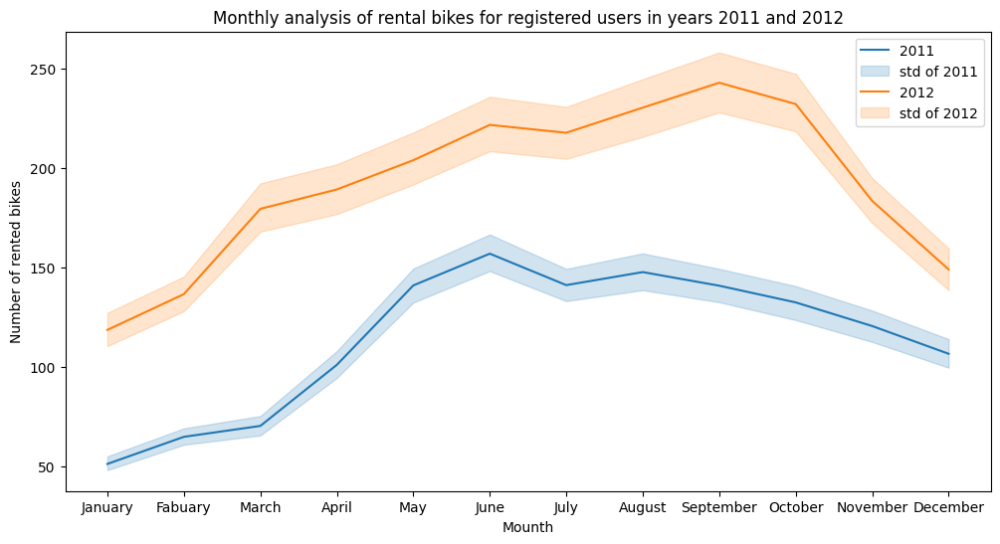

In [45]:
fig=plt.figure(figsize=(12,6))
ax = plt.axes()

l=df1.year.unique()
ax.set_xticks(np.arange(1,13))
ax.set_xticklabels(labels=['January','Fabuary','March','April','May','June','July','August','September','October','November','December'])


for i in range(len(df1.year.unique())):
    sns.lineplot(x=df1['month'][df1['year']==l[i]], y=df1['registered'][df1['year']==l[i]], estimator='mean')



plt.legend(['2011 ','std of 2011','2012','std of 2012'])
plt.xlabel('Mounth')
plt.ylabel('Number of rented bikes')
plt.title('Monthly analysis of rental bikes for registered users in years 2011 and 2012')

Plot of monthly analysis of rental bikes for registered users in years 2011 and 2012 (sum of number)

Text(0.5, 1.0, 'Monthly analysis of rental bikes for registered users in years 2011 and 2012')

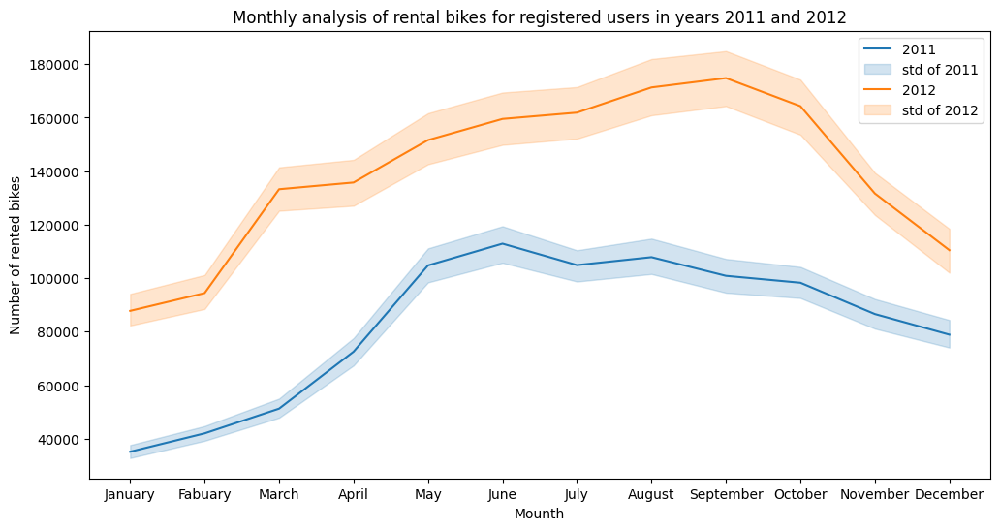

In [46]:
fig=plt.figure(figsize=(12,6))
ax = plt.axes()

l=df1.year.unique()
ax.set_xticks(np.arange(1,13))
ax.set_xticklabels(labels=['January','Fabuary','March','April','May','June','July','August','September','October','November','December'])


for i in range(len(df1.year.unique())):
    sns.lineplot(x=df1['month'][df1['year']==l[i]], y=df1['registered'][df1['year']==l[i]], estimator='sum')



plt.legend(['2011 ','std of 2011','2012','std of 2012'])
plt.xlabel('Mounth')
plt.ylabel('Number of rented bikes')
plt.title('Monthly analysis of rental bikes for registered users in years 2011 and 2012')

Plot of monthly analysis of rental bikes for registered users 

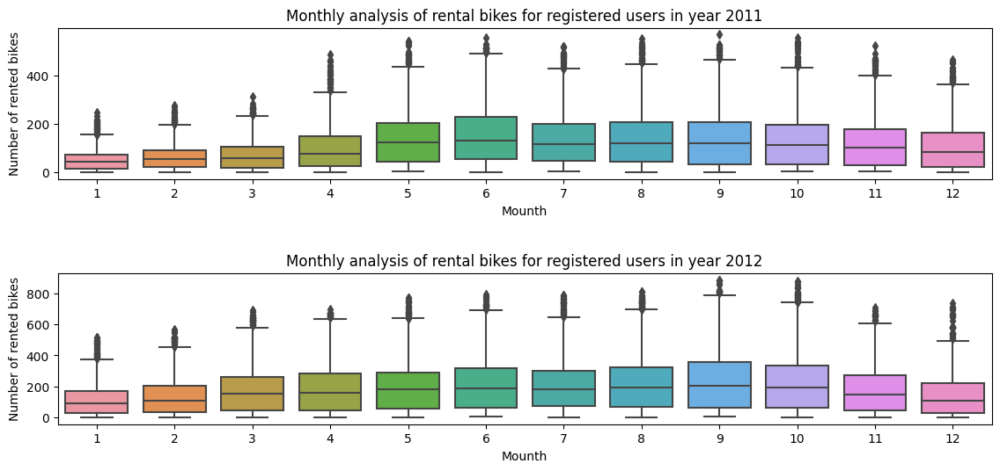

In [47]:
fig=plt.figure(figsize=(12,6))

l=df1.year.unique()
ax.set_xticks(np.arange(1,13))
ax.set_xticklabels(labels=['January','Fabuary','March','April','May','June','July','August','September','October','November','December'])


for i in range(len(df1.year.unique())):
    fig= plt.subplot2grid((2,1),(i,0))

    #ax.set_xticks(np.arange(1,13))
    #ax.set_xticklabels(labels=['January','Fabuary','March','April','May','June','July','August','September','October','November','December'])

    sns.boxplot(x=df1['mnth'][df1['year']==l[i]], y=df1['registered'][df1['year']==l[i]])
    plt.xlabel('Mounth')
    plt.ylabel('Number of rented bikes')
    plt.title('Monthly analysis of rental bikes for registered users in year {}'.format(l[i]))
    plt.tight_layout(pad=3)






In [48]:
df1['day']=df1['dteday'].dt.day

Plot of relation between apparant temperature and number of bike rentals using linear regresion. Here causion is needed in using parameters of regplot. To be sure that linear regresion is a good condidate for the data it is better to have plots with different parameters (here I tested x_bins and x_estimator).

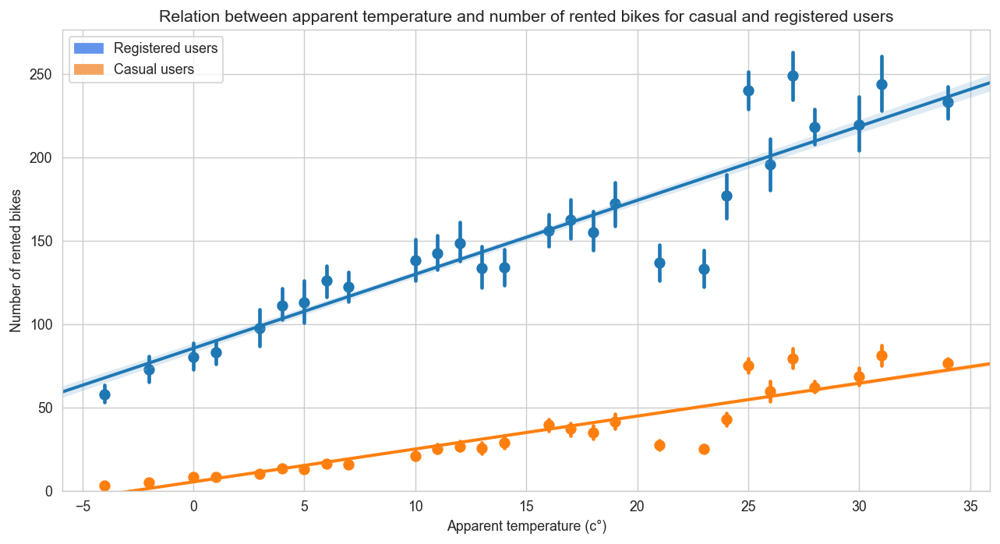

In [49]:
plt.figure(figsize=(12,6), dpi=128)
sns.set_style("whitegrid")
s1 = sns.regplot(x='real_atemp', y='registered', data=df1, ci=95, truncate=False,x_bins=30)
s2 = sns.regplot(x='real_atemp', y='casual', data=df1, ci=95, truncate=False,x_bins=30)
plt.ylim(0)
plt.title('Relation between apparent temperature and number of rented bikes for casual and registered users')
plt.ylabel('Number of rented bikes')
plt.xlabel('Apparent temperature (c°)')
p_a = mpatches.Patch(color='cornflowerblue', label='Registered users')
p_b = mpatches.Patch(color='sandybrown', label='Casual users')
plt.legend(handles=[p_a,p_b])



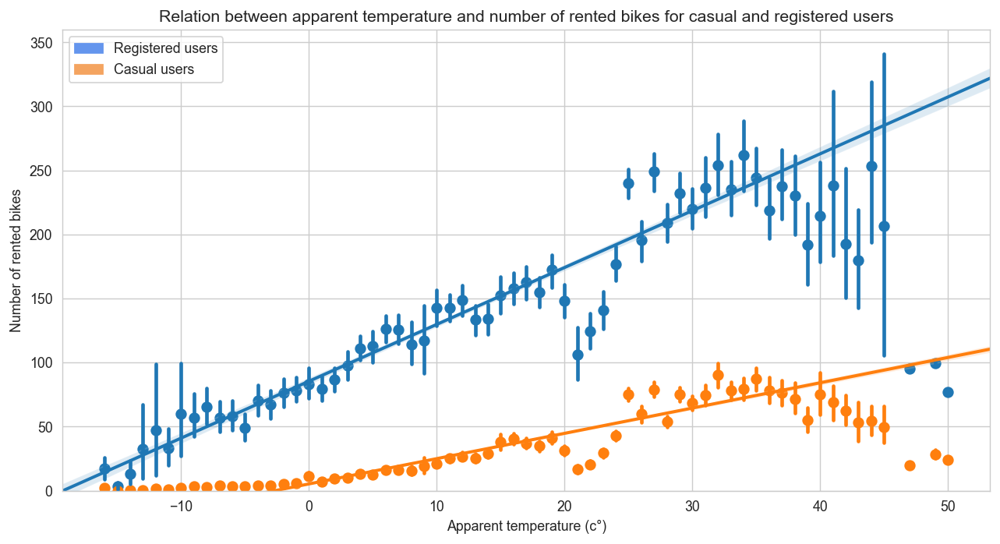

In [50]:
plt.figure(figsize=(12,6), dpi=128)
sns.set_style("whitegrid")
s1 = sns.regplot(x='real_atemp', y='registered', data=df1, ci=95, truncate=False,x_estimator=np.mean)
s2 = sns.regplot(x='real_atemp', y='casual', data=df1, ci=95, truncate=False,x_estimator=np.mean)
plt.ylim(0)
plt.title('Relation between apparent temperature and number of rented bikes for casual and registered users')
plt.ylabel('Number of rented bikes')
plt.xlabel('Apparent temperature (c°)')
p_a = mpatches.Patch(color='cornflowerblue', label='Registered users')
p_b = mpatches.Patch(color='sandybrown', label='Casual users')
plt.legend(handles=[p_a,p_b])

Plot of relation between humidity and number of bike rentals using linear regresion. Here causion is needed in using parameters of regplot. To be sure that linear regresion is a good condidate for the data it is better to have plots with different parameters (here I tested x_bins and x_estimator).

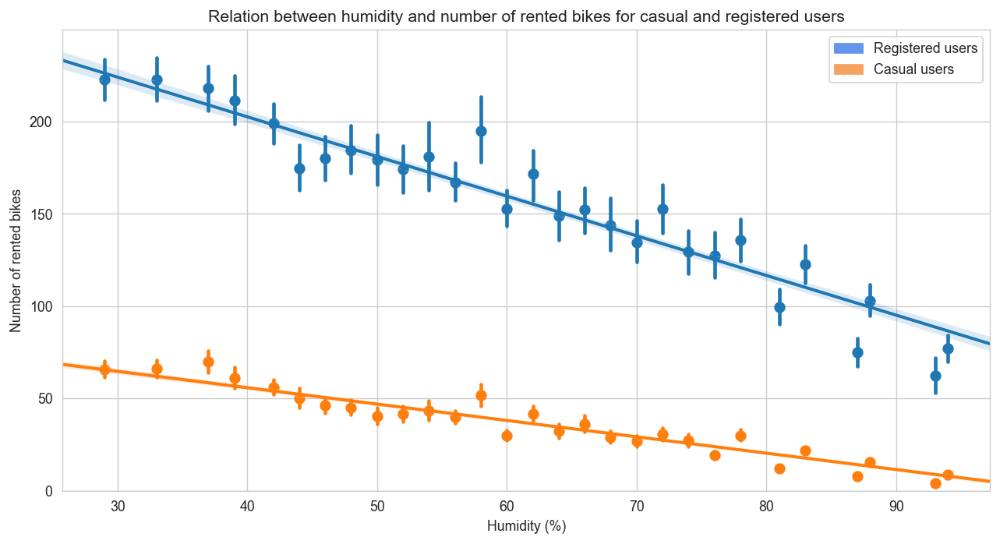

In [51]:
plt.figure(figsize=(12,6), dpi=128)
sns.set_style("whitegrid")
s1 = sns.regplot(x='real_hum', y='registered', data=df1, ci=95, truncate=False,x_bins=30)
s2 = sns.regplot(x='real_hum', y='casual', data=df1, ci=95, truncate=False,x_bins=30)
plt.ylim(0)
plt.title('Relation between humidity and number of rented bikes for casual and registered users')
plt.ylabel('Number of rented bikes')
plt.xlabel('Humidity (%)')
p_a = mpatches.Patch(color='cornflowerblue', label='Registered users')
p_b = mpatches.Patch(color='sandybrown', label='Casual users')
plt.legend(handles=[p_a,p_b])


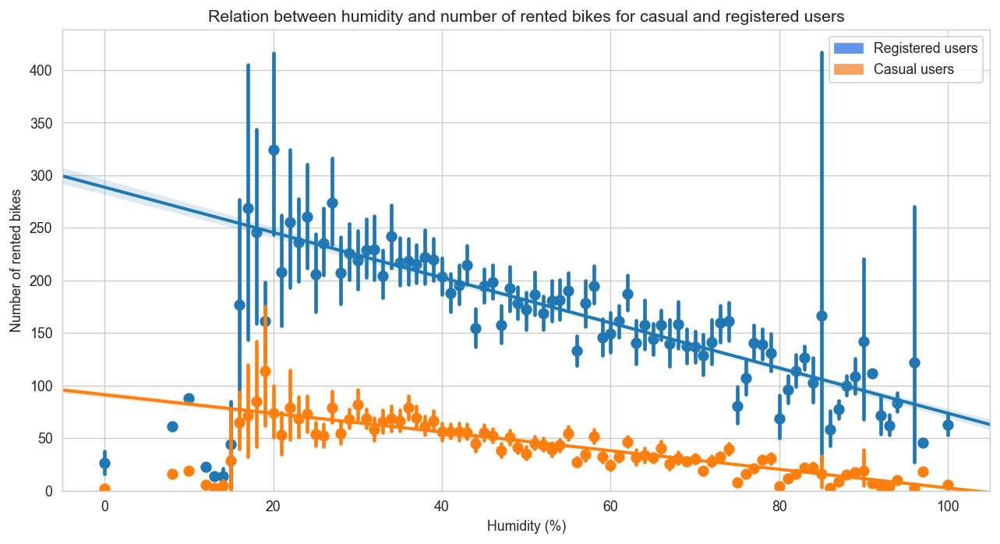

In [52]:
plt.figure(figsize=(12,6), dpi=128)
sns.set_style("whitegrid")
s1 = sns.regplot(x='real_hum', y='registered', data=df1, ci=95, truncate=False,x_estimator=np.mean)
s2 = sns.regplot(x='real_hum', y='casual', data=df1, ci=95, truncate=False,x_estimator=np.mean)
plt.ylim(0)
plt.title('Relation between humidity and number of rented bikes for casual and registered users')
plt.ylabel('Number of rented bikes')
plt.xlabel('Humidity (%)')
p_a = mpatches.Patch(color='cornflowerblue', label='Registered users')
p_b = mpatches.Patch(color='sandybrown', label='Casual users')
plt.legend(handles=[p_a,p_b])

Plot of relation between wind speed and number of bike rentals using linear regresion. Here causion is needed in using parameters of regplot. To be sure that linear regresion is a good condidate for the data it is better to have plots with different parameters (here I tested x_bins and x_estimator). Here by looking at the second plot, it is clear that linear regresion is not a good option.

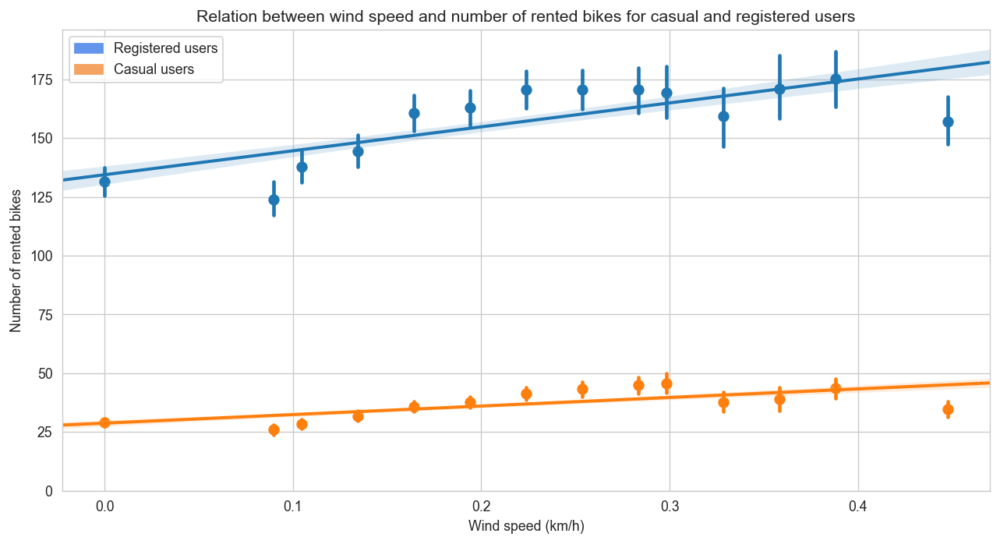

In [53]:
plt.figure(figsize=(12,6), dpi=128)
sns.set_style("whitegrid")
s1 = sns.regplot(x='windspeed', y='registered', data=df1, ci=95, truncate=False,x_bins=30)
s2 = sns.regplot(x='windspeed', y='casual', data=df1, ci=95, truncate=False,x_bins=30)
plt.ylim(0)
plt.title('Relation between wind speed and number of rented bikes for casual and registered users')
plt.ylabel('Number of rented bikes')
plt.xlabel('Wind speed (km/h)')
p_a = mpatches.Patch(color='cornflowerblue', label='Registered users')
p_b = mpatches.Patch(color='sandybrown', label='Casual users')
plt.legend(handles=[p_a,p_b])

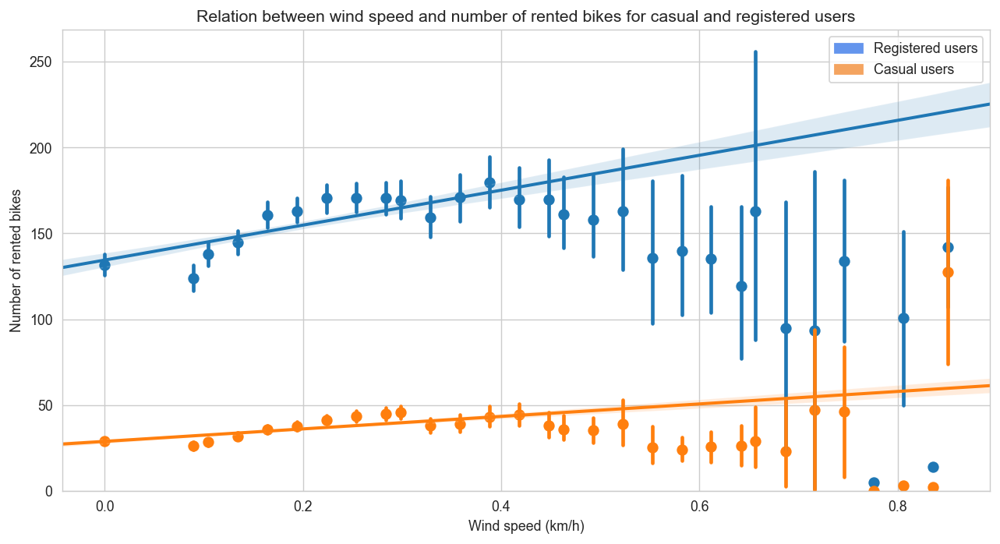

In [54]:
plt.figure(figsize=(12,6), dpi=128)
sns.set_style("whitegrid")
s1 = sns.regplot(x='windspeed', y='registered', data=df1, ci=95, truncate=False,x_estimator=np.mean)
s2 = sns.regplot(x='windspeed', y='casual', data=df1, ci=95, truncate=False,x_estimator=np.mean)
plt.ylim(0)
plt.title('Relation between wind speed and number of rented bikes for casual and registered users')
plt.ylabel('Number of rented bikes')
plt.xlabel('Wind speed (km/h)')
p_a = mpatches.Patch(color='cornflowerblue', label='Registered users')
p_b = mpatches.Patch(color='sandybrown', label='Casual users')
plt.legend(handles=[p_a,p_b])


Plot of yearly analysis of rental bikes for registered users in years 2011 and 2012

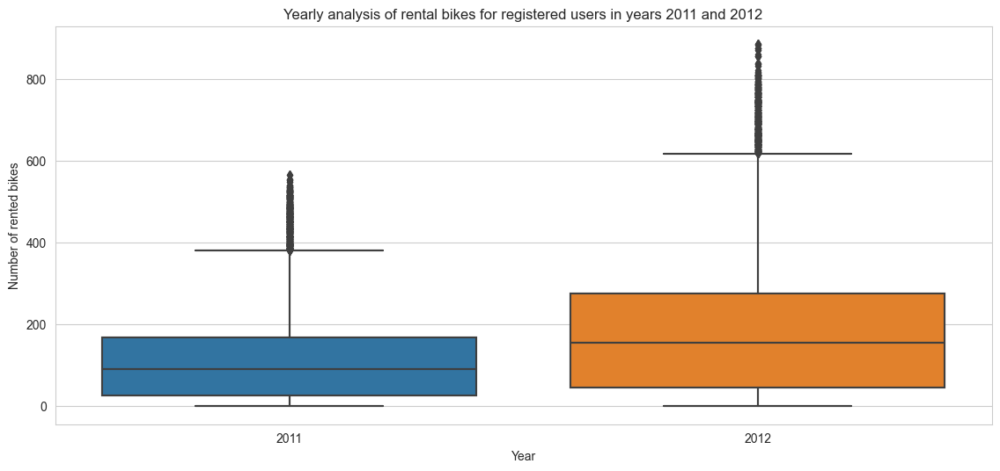

In [55]:
fig=plt.figure(figsize=(12,6))

l=df1.year.unique()
ax.set_xticks(np.arange(1,13))
ax.set_xticklabels(labels=['January','Fabuary','March','April','May','June','July','August','September','October','November','December'])


for i in range(len(df1.year.unique())):
 
    sns.boxplot(x=df1['year'], y=df1['registered'])
    plt.xlabel('Year')
    plt.ylabel('Number of rented bikes')
    plt.title('Yearly analysis of rental bikes for registered users in years 2011 and 2012') 
    plt.tight_layout(pad=3)

Create a time serise from the dataset (aggregate the monthly data based on their mean)

In [56]:
import datetime

l=[]
count=2011
for c in range(2):
    count+=c
    for i in range(12):
        l.append(df1['cnt'][(df1['month']==i+1) & (df1['year']==count)].agg('mean'))




#min_month = "2011-01"
#max_month = "2012-12"

#months = pd.period_range(min_month, max_month, freq='M')
months=['2011-01','2011-02','2011-03','2011-04','2011-05','2011-06','2011-07','2011-08','2011-09','2011-10','2011-11','2011-12'
,'2012-01','2012-02','2012-03','2012-04','2012-05','2012-06','2012-07','2012-08','2012-09','2012-10','2012-11','2012-12']
df3=pd.DataFrame({'date': months,'cnt':l})

df3['date']=pd.to_datetime(df3['date'])
df3

,date,cnt
0,2011-01-01,55.507267
1,2011-02-01,74.291217
2,2011-03-01,87.732877
3,2011-04-01,131.947149
4,2011-05-01,182.555108
5,2011-06-01,199.322222
6,2011-07-01,189.974462
7,2011-08-01,186.991792
8,2011-09-01,177.709902
9,2011-10-01,166.232840


Ploting time series of monthly and  the whole dataset 

Text(0, 0.5, 'Total number of rented bikes')

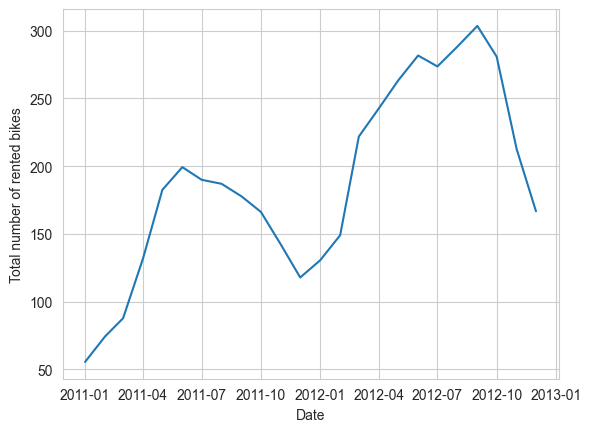

In [57]:

plt.plot(df3['date'],df3['cnt'])
plt.xlabel('Date')
plt.ylabel('Total number of rented bikes')

/var/folders/nm/btrww2_94pncl34mb0yt49j80000gn/T/ipykernel_99258/3558602112.py:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



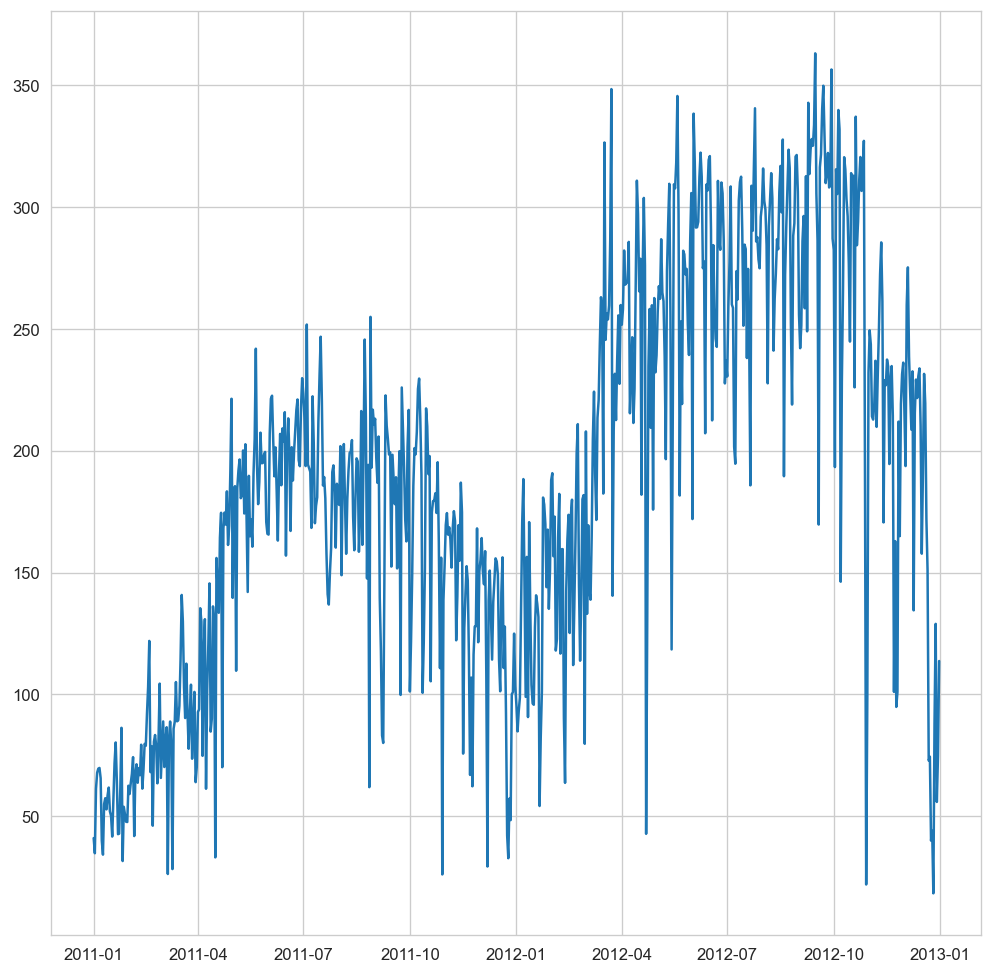

In [106]:
df0=df1.groupby('dteday').mean()
plt.plot(df0.index,df0['cnt'])


In [58]:
df3.set_index('date', inplace=True,drop=False)
df3=df3.drop('date',axis=1)


Ploting trend, seasonality and residual of dataset for monthly and the wohle 

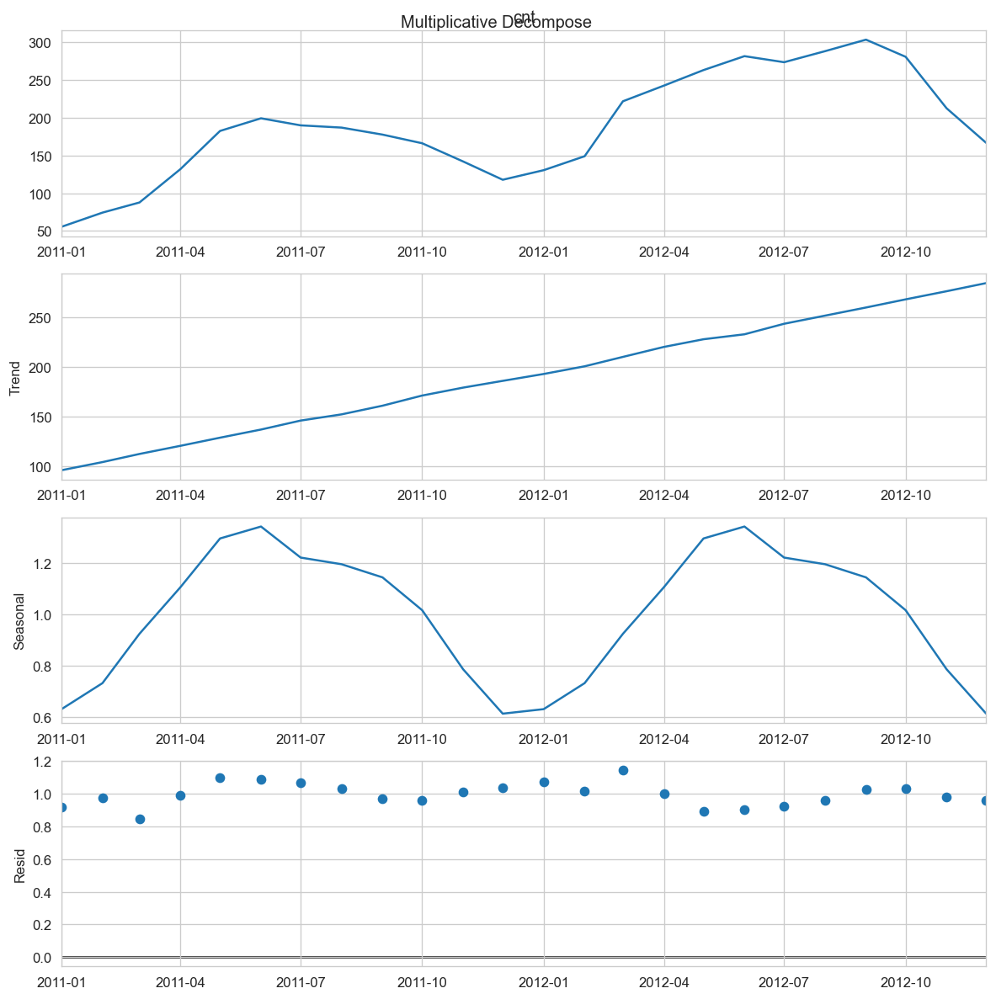

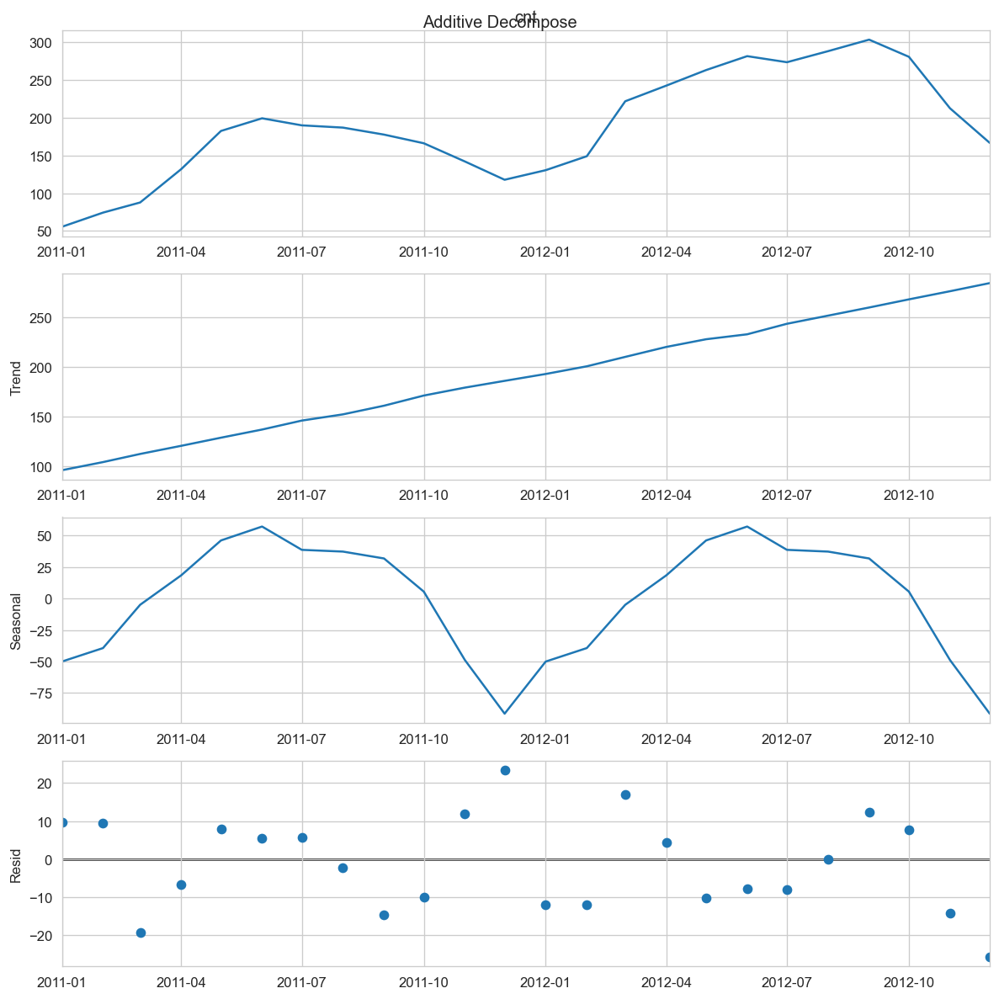

In [117]:
from statsmodels.tsa.seasonal import seasonal_decompose
from dateutil.parser import parse

# Import Data

# Multiplicative Decomposition 
result_mul_m = seasonal_decompose(df3['cnt'], model='multiplicative', extrapolate_trend='freq')

# Additive Decomposition
result_add_m = seasonal_decompose(df3['cnt'], model='additive', extrapolate_trend='freq')

# Plot
plt.rcParams.update({'figure.figsize': (10,10)})
result_mul_m.plot().suptitle('Multiplicative Decompose', fontsize=12)
result_add_m.plot().suptitle('Additive Decompose', fontsize=12)
plt.show()

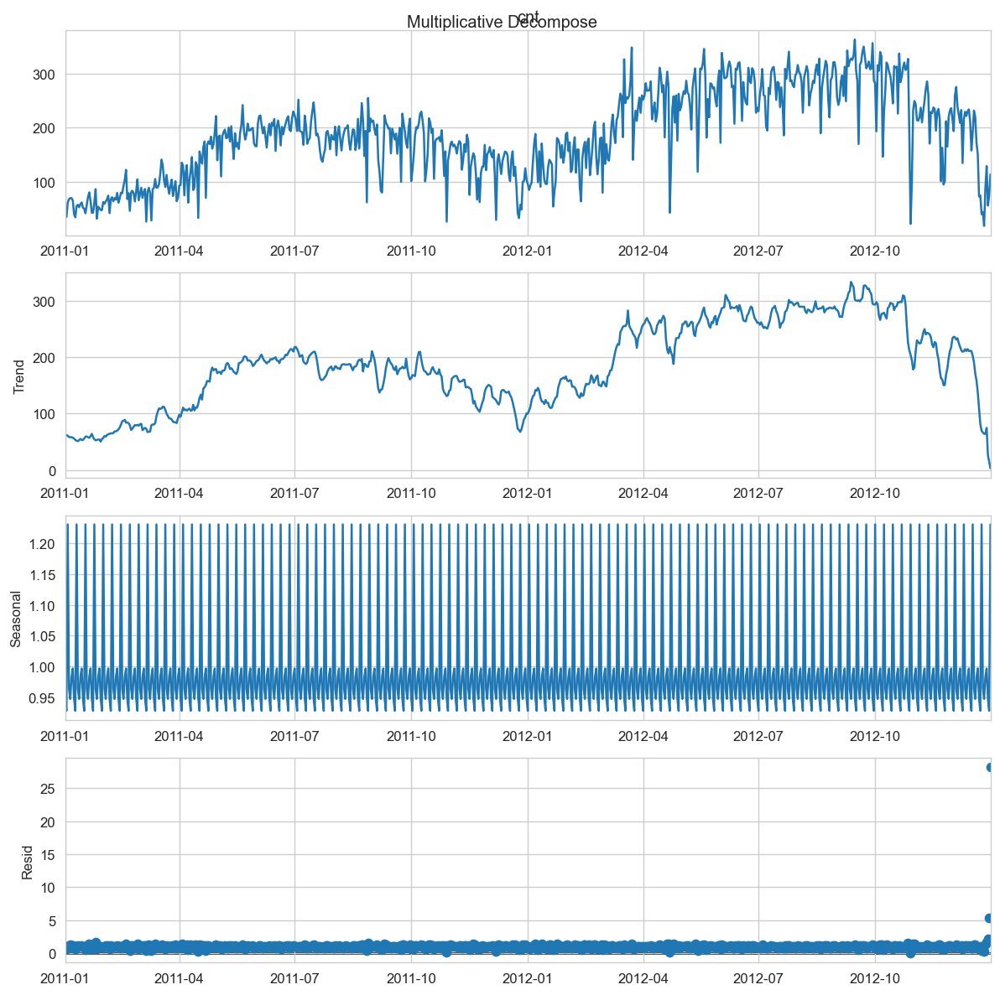

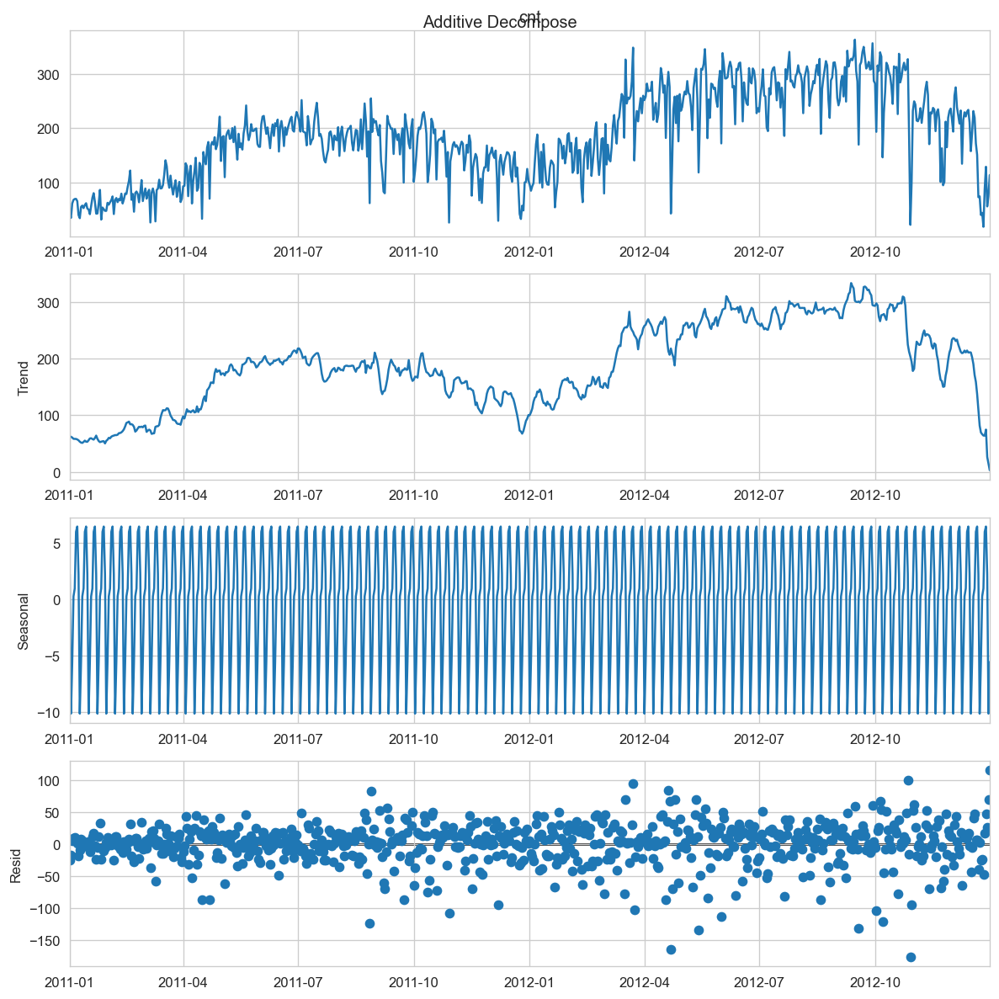

In [118]:
from statsmodels.tsa.seasonal import seasonal_decompose
from dateutil.parser import parse

# Import Data

# Multiplicative Decomposition 
result_mul_total = seasonal_decompose(df0['cnt'], model='multiplicative', extrapolate_trend='freq')

# Additive Decomposition
result_add_total = seasonal_decompose(df0['cnt'], model='additive', extrapolate_trend='freq')

# Plot
plt.rcParams.update({'figure.figsize': (10,10)})
result_mul_total.plot().suptitle('Multiplicative Decompose', fontsize=12)
result_add_total.plot().suptitle('Additive Decompose', fontsize=12)
plt.show()

Creating a dataframe from trend, seasonality, residualand time series for monthly and whole dataset

In [159]:
# Actual Values = Product of (Seasonal * Trend * Resid)
df_reconstructed_m = pd.concat([result_mul_m.seasonal, result_mul_m.trend, result_mul_m.resid, result_mul_m.observed], axis=1)
df_reconstructed_m.columns = ['seasonality', 'trend', 'residuals', 'time_series']
df_reconstructed_m.head()

,seasonality,trend,residuals,time_series
date,,,,
2011-01-01,0.631230,95.898997,0.916955,55.507267
2011-02-01,0.732294,104.077566,0.974754,74.291217
2011-03-01,0.923913,112.256135,0.845905,87.732877
2011-04-01,1.104877,120.434704,0.991596,131.947149
2011-05-01,1.294252,128.613273,1.096704,182.555108


In [160]:
# Actual Values = Product of (Seasonal * Trend * Resid)
df_reconstructed_total = pd.concat([result_mul_total.seasonal, result_mul_total.trend, result_mul_total.resid, result_mul_total.observed], axis=1)
df_reconstructed_total.columns = ['seasonality', 'trend', 'residuals', 'time_series']
df_reconstructed_total.head()

,seasonality,trend,residuals,time_series
dteday,,,,
2011-01-01,0.948504,63.197491,0.684677,41.041667
2011-01-02,0.928635,62.053222,0.604359,34.826087
2011-01-03,1.230112,60.908953,0.818396,61.318182
2011-01-04,0.964271,58.591780,1.202036,67.913043
2011-01-05,0.947865,58.437018,1.255907,69.565217


KSPP and ADF tests for testing whether time series is stationary or not for monthly and the whole dataset (p values of ADF are higher than 0.05 and for KPSS p values are small, indicaing that time series are not stationary)

In [61]:
from statsmodels.tsa.stattools import adfuller, kpss

# ADF Test
result = adfuller(df3.cnt.values, autolag='AIC')
print(f'ADF Statistic: {result[0]}')
print(f'p-value: {result[1]}')
for key, value in result[4].items():
    print('Critial Values:')
    print(f'   {key}, {value}')

# KPSS Test
result = kpss(df3.cnt.values, regression='c')
print('\nKPSS Statistic: %f' % result[0])
print('p-value: %f' % result[1])
for key, value in result[3].items():
    print('Critial Values:')
    print(f'   {key}, {value}')

ADF Statistic: -2.50905297501517
p-value: 0.1132871477884167
Critial Values:
   1%, -3.769732625845229
Critial Values:
   5%, -3.005425537190083
Critial Values:
   10%, -2.6425009917355373

KPSS Statistic: 0.478452
p-value: 0.046520
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


In [161]:

# ADF Test
result = adfuller(df0.cnt.values, autolag='AIC')
print(f'ADF Statistic: {result[0]}')
print(f'p-value: {result[1]}')
for key, value in result[4].items():
    print('Critial Values:')
    print(f'   {key}, {value}')

# KPSS Test
result = kpss(df0.cnt.values, regression='c')
print('\nKPSS Statistic: %f' % result[0])
print('p-value: %f' % result[1])
for key, value in result[3].items():
    print('Critial Values:')
    print(f'   {key}, {value}')

ADF Statistic: -1.8677460644756068
p-value: 0.3473831291574315
Critial Values:
   1%, -3.439503230053971
Critial Values:
   5%, -2.8655794463678346
Critial Values:
   10%, -2.5689210707289982

KPSS Statistic: 2.426210
p-value: 0.010000
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:2018: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.




Removing trend

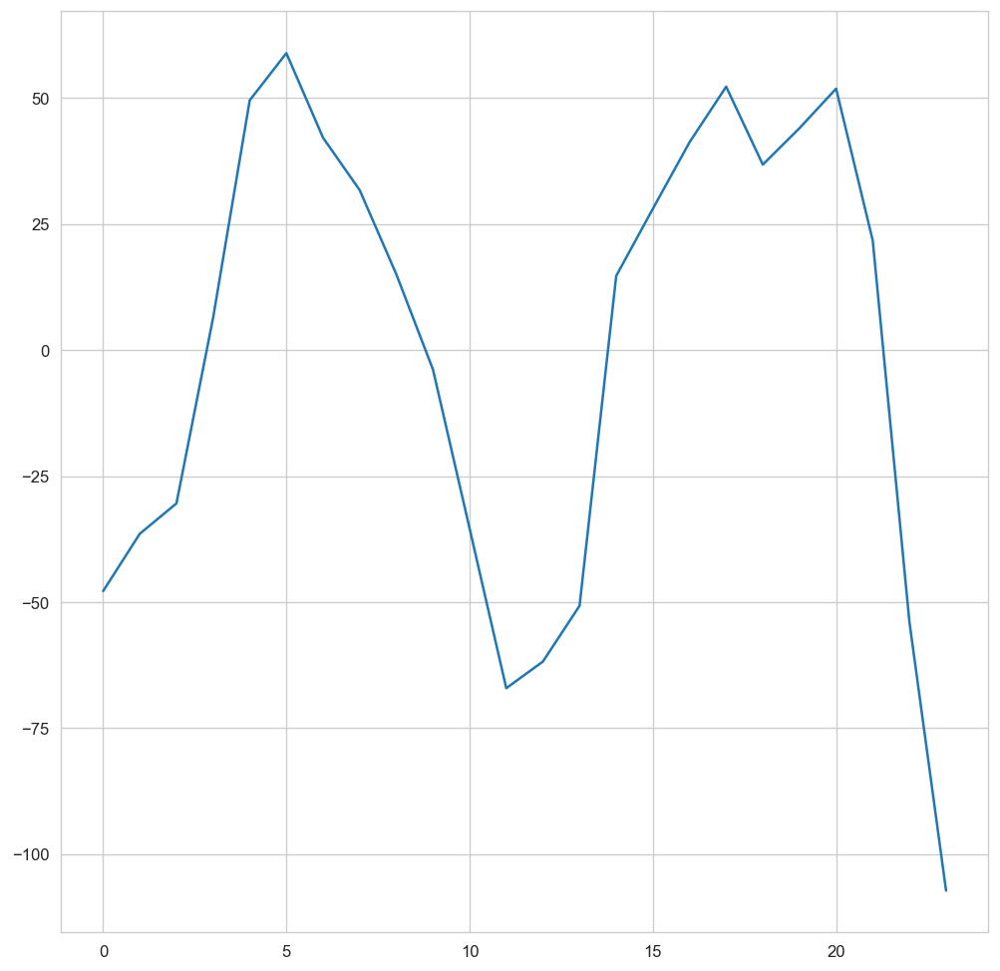

In [169]:
# Using scipy: Subtract the line of best fit
from scipy import signal
detrended_m = signal.detrend(df3.cnt.values)
plt.plot(detrended_m)

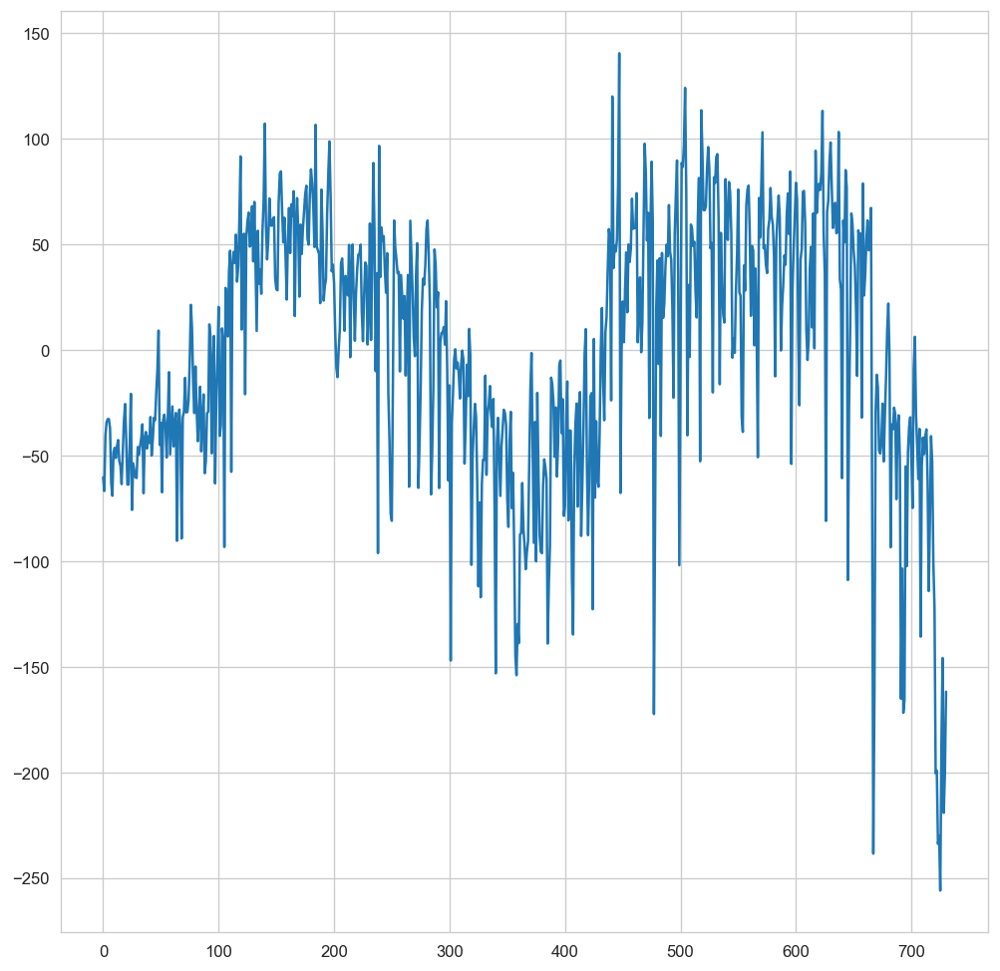

In [170]:
detrended_total = signal.detrend(df0.cnt.values)
plt.plot(detrended_total)

removing seasonality

/var/folders/nm/btrww2_94pncl34mb0yt49j80000gn/T/ipykernel_99258/1019447864.py:1: RuntimeWarning:

invalid value encountered in log



[]

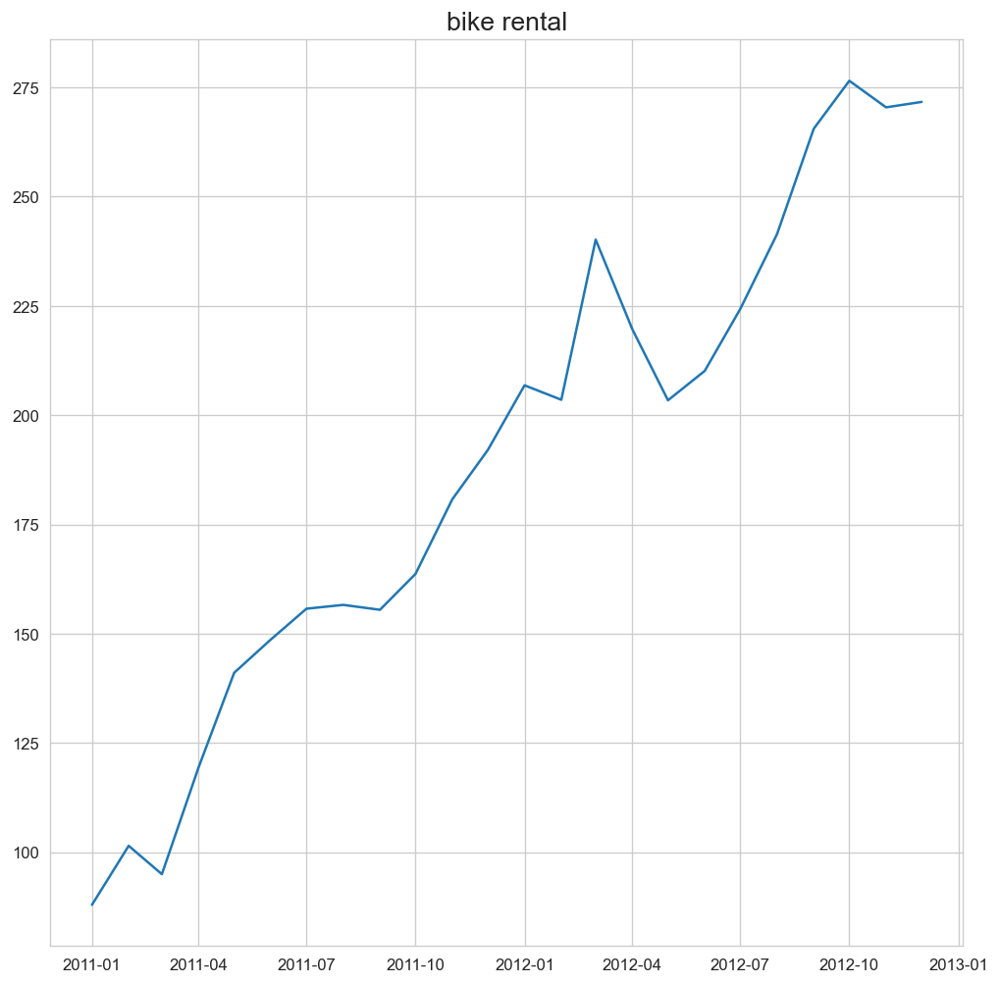

In [171]:
detrended_log=np.log(detrended_m)
# Time Series Decomposition
result_mul_m = seasonal_decompose(df3['cnt'], model='multiplicative', extrapolate_trend='freq')

# Deseasonalize
deseasonalized_m = df3.cnt.values / result_mul_m.seasonal

# Plot
plt.plot(deseasonalized_m)
plt.title('bike rental', fontsize=16)
plt.plot()

/var/folders/nm/btrww2_94pncl34mb0yt49j80000gn/T/ipykernel_99258/3871242603.py:1: RuntimeWarning:

invalid value encountered in log



[]

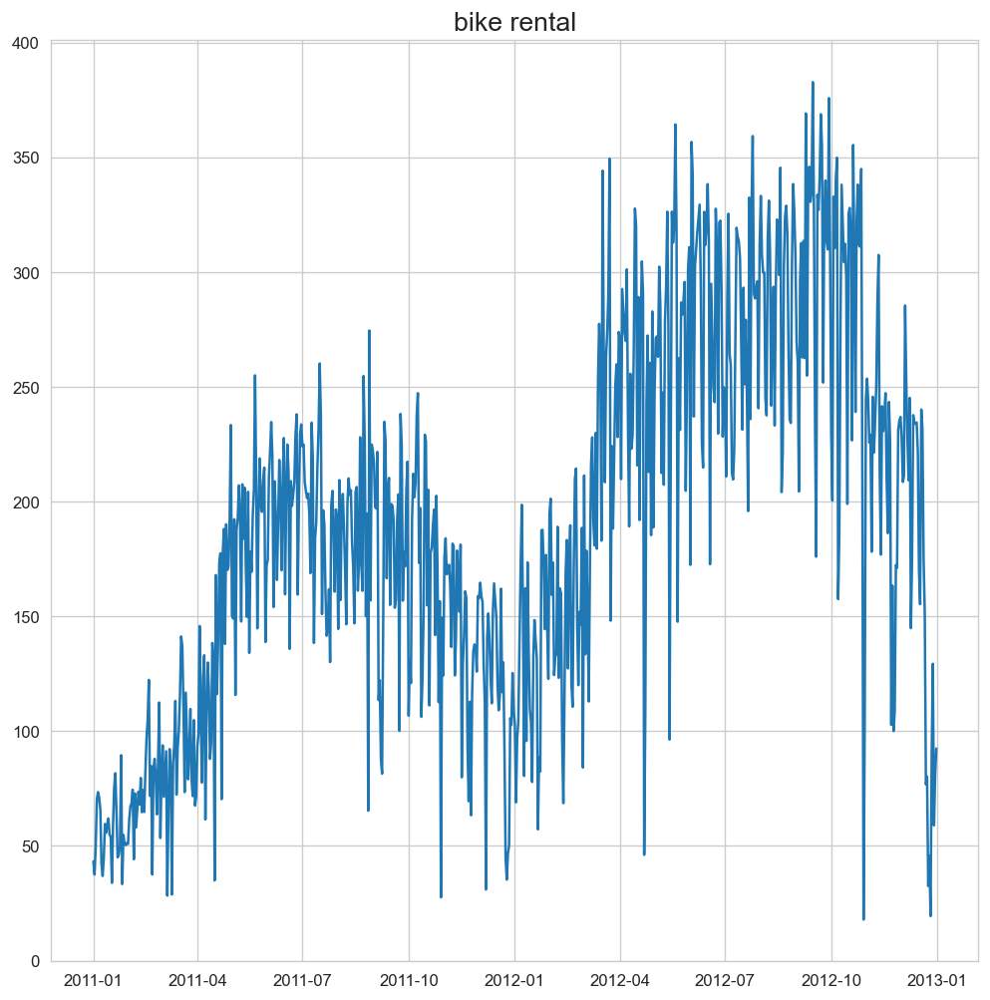

In [172]:
detrended_log=np.log(detrended_total)
# Time Series Decomposition
result_mul_total = seasonal_decompose(df0['cnt'], model='multiplicative', extrapolate_trend='freq')

# Deseasonalize
deseasonalized_total = df0.cnt.values / result_mul_total.seasonal

# Plot
plt.plot(deseasonalized_total)
plt.title('bike rental', fontsize=16)
plt.plot()

Another way to remove the trend

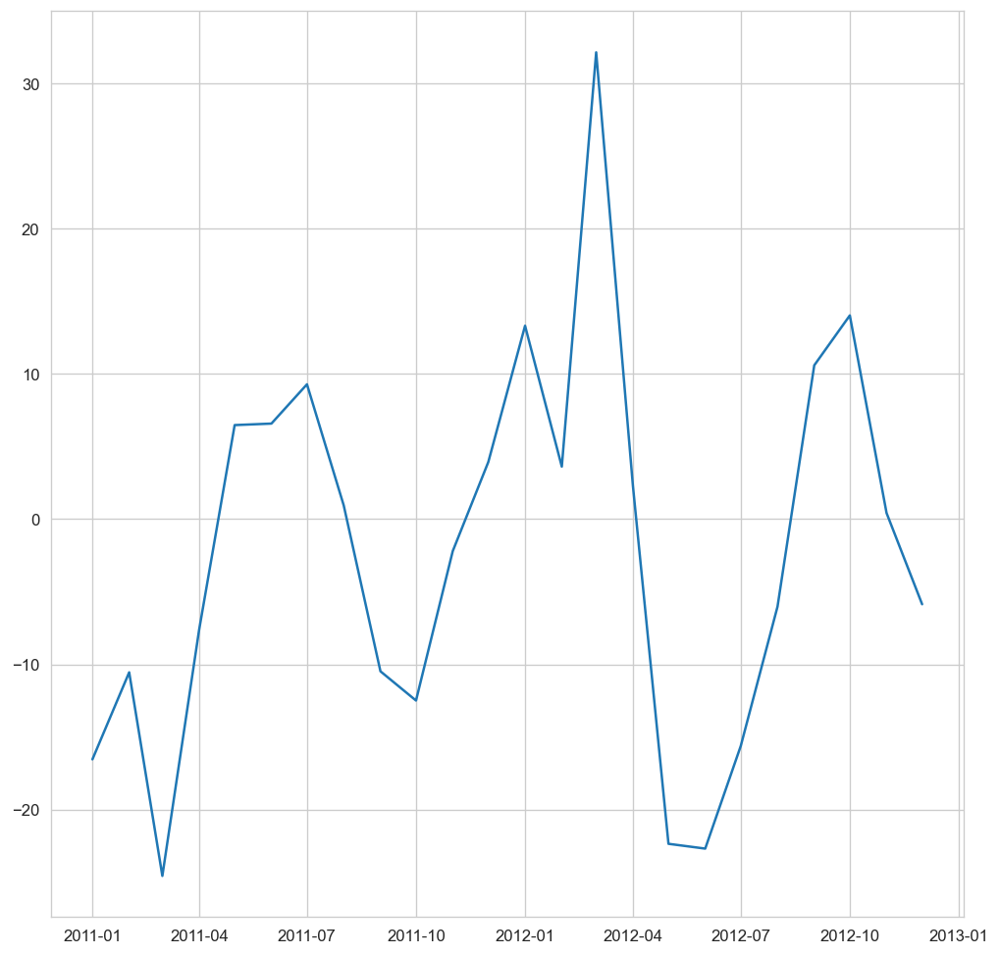

In [173]:
# Using statmodels: Subtracting the Trend Component.
from statsmodels.tsa.seasonal import seasonal_decompose
result_mul_m = seasonal_decompose(deseasonalized_m, model='multiplicative', extrapolate_trend='freq')
detrended_m = deseasonalized_m.values - result_mul_m.trend
plt.plot(detrended_m)

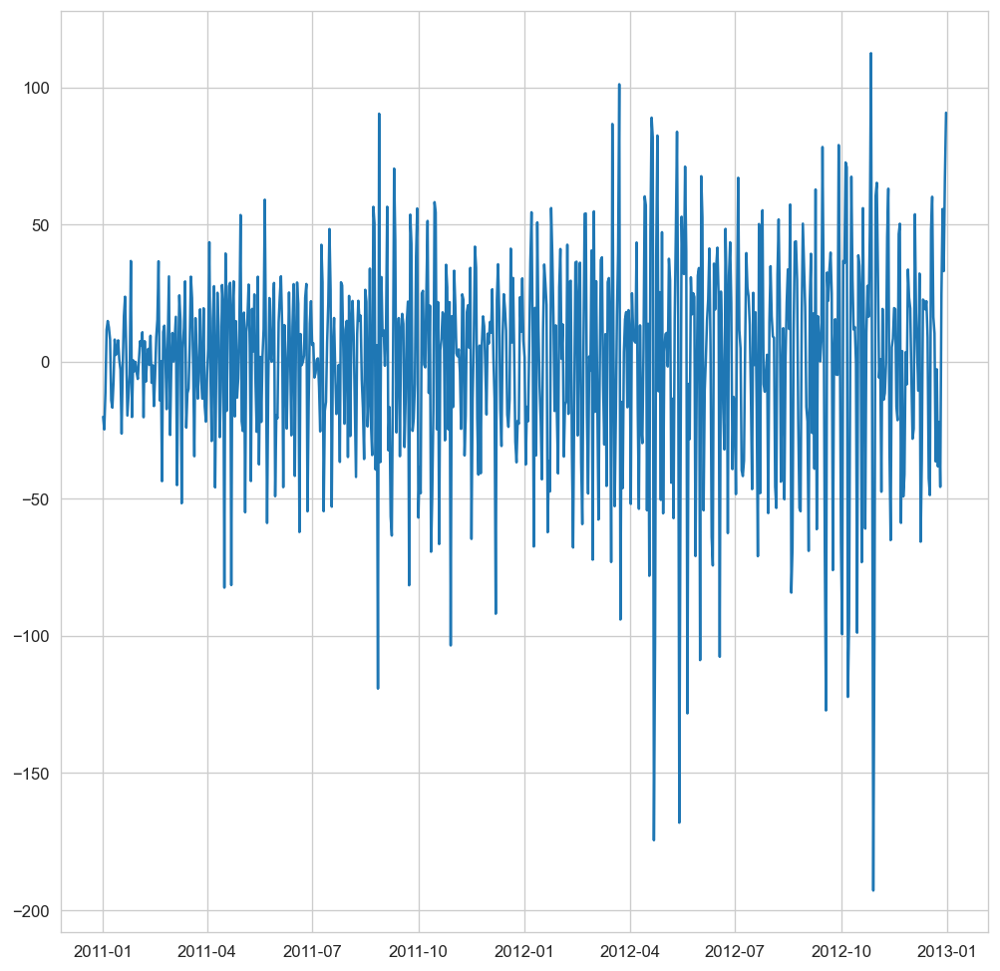

In [174]:
# Using statmodels: Subtracting the Trend Component.
from statsmodels.tsa.seasonal import seasonal_decompose
result_mul_total = seasonal_decompose(deseasonalized_total, model='multiplicative', extrapolate_trend='freq')
detrended_total = deseasonalized_total.values - result_mul_total.trend
plt.plot(detrended_total)

Making a datafram with a column named trend

In [175]:
trend_dm=pd.DataFrame(detrended_m)
trend_dtotal=pd.DataFrame(detrended_total)

plot autocorrelation to see seasonality. I plot both detrend and deseasonaled.

<AxesSubplot: xlabel='Lag', ylabel='Autocorrelation'>

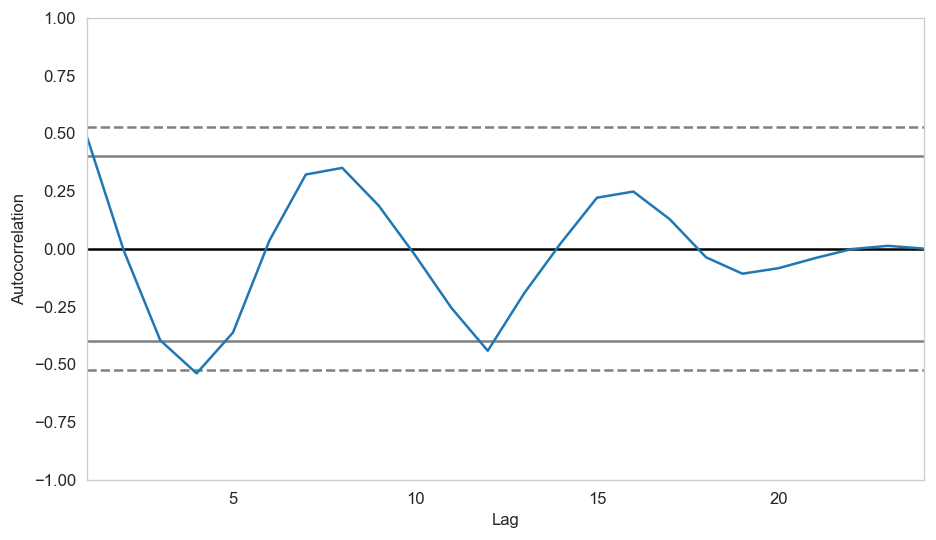

In [176]:
from pandas.plotting import autocorrelation_plot

plt.rcParams.update({'figure.figsize':(9,5), 'figure.dpi':120})
autocorrelation_plot(trend_dm.trend.tolist())

<AxesSubplot: xlabel='Lag', ylabel='Autocorrelation'>

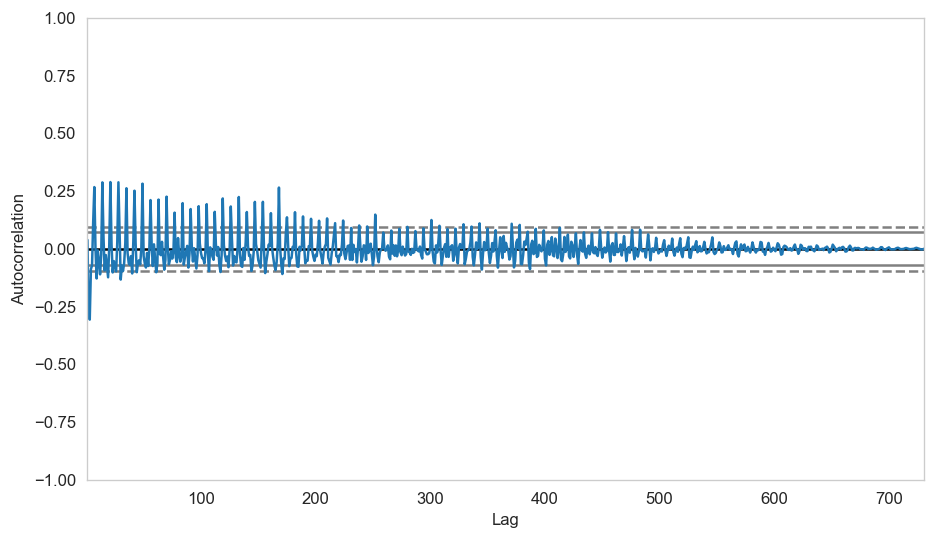

In [177]:
plt.rcParams.update({'figure.figsize':(9,5), 'figure.dpi':120})
autocorrelation_plot(trend_dtotal.trend.tolist())

Making a datafram with a column named seasonal

In [178]:
season_dm=pd.DataFrame(deseasonalized_m)
season_dtotal=pd.DataFrame(deseasonalized_total)


<AxesSubplot: xlabel='Lag', ylabel='Autocorrelation'>

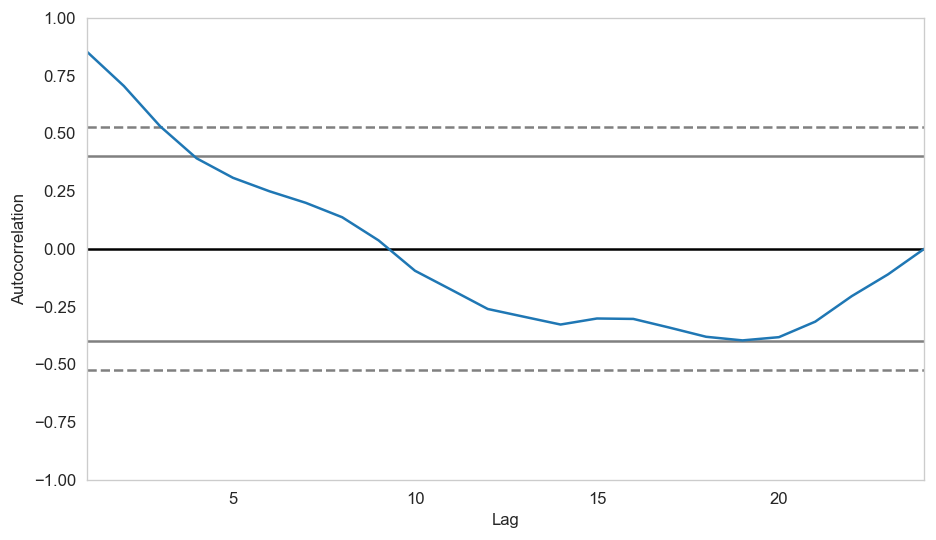

In [179]:

plt.rcParams.update({'figure.figsize':(9,5), 'figure.dpi':120})
autocorrelation_plot(season_dm.seasonal.tolist())

<AxesSubplot: xlabel='Lag', ylabel='Autocorrelation'>

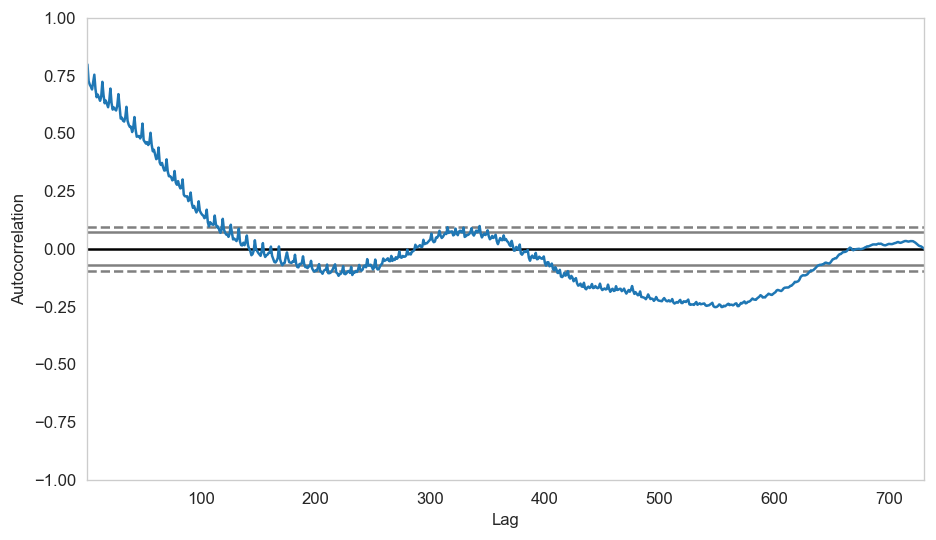

In [180]:
plt.rcParams.update({'figure.figsize':(9,5), 'figure.dpi':120})
autocorrelation_plot(season_dtotal.seasonal.tolist())

ploting autocorrelation and partially autocorrelation functions

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



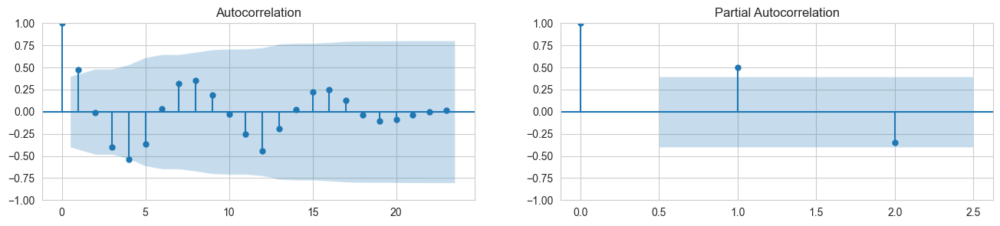

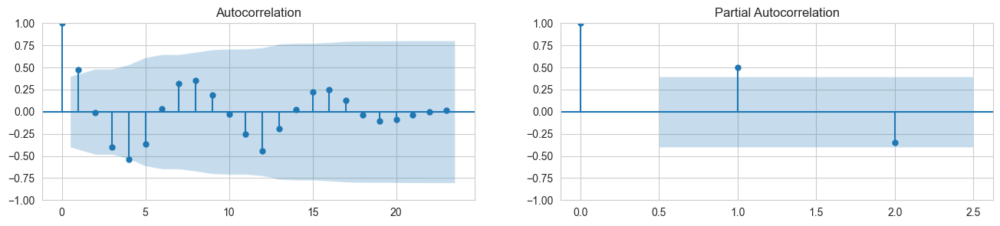

In [181]:
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf


# Draw Plot
fig, axes = plt.subplots(1,2,figsize=(16,3), dpi= 100)
plot_acf(trend_dm.trend.tolist(), lags=23, ax=axes[0])
plot_pacf(trend_dm.trend.tolist(), lags=2, ax=axes[1])

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



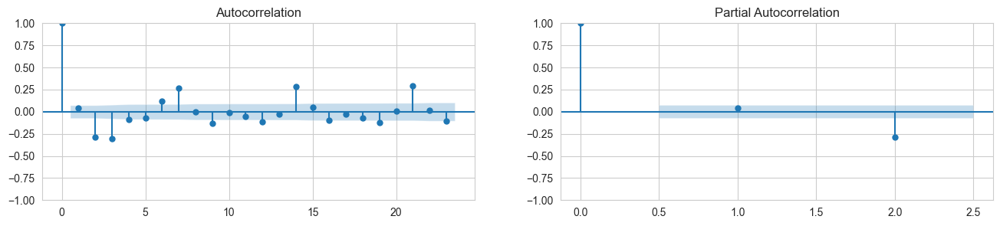

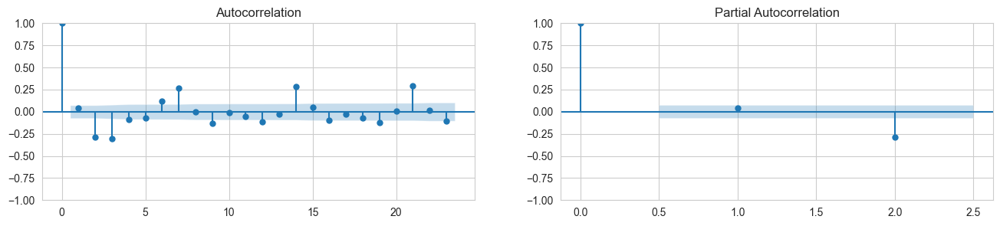

In [182]:
# Draw Plot
fig, axes = plt.subplots(1,2,figsize=(16,3), dpi= 100)
plot_acf(trend_dtotal.trend.tolist(), lags=23, ax=axes[0])
plot_pacf(trend_dtotal.trend.tolist(), lags=2, ax=axes[1])

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



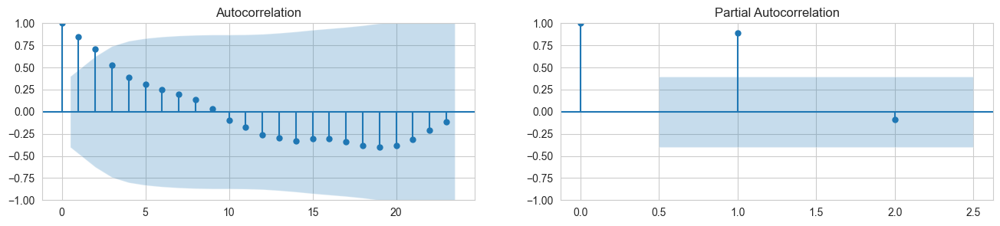

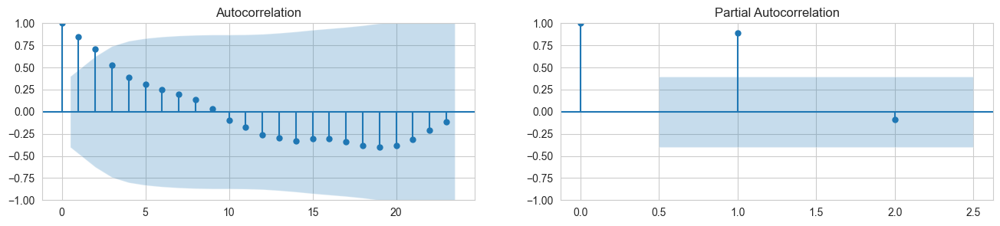

In [183]:

# Draw Plot
fig, axes = plt.subplots(1,2,figsize=(16,3), dpi= 100)
plot_acf(season_dm.seasonal.tolist(), lags=23, ax=axes[0])
plot_pacf(season_dm.seasonal.tolist(), lags=2, ax=axes[1])

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



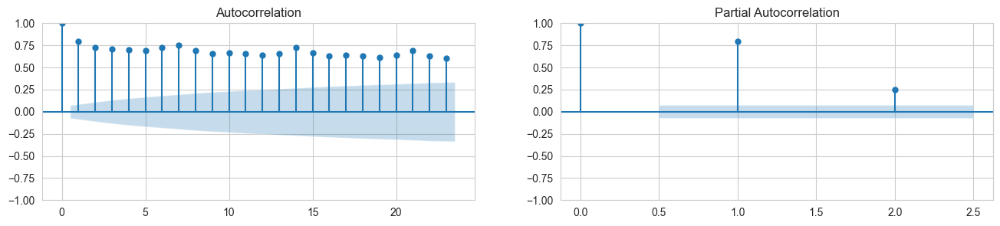

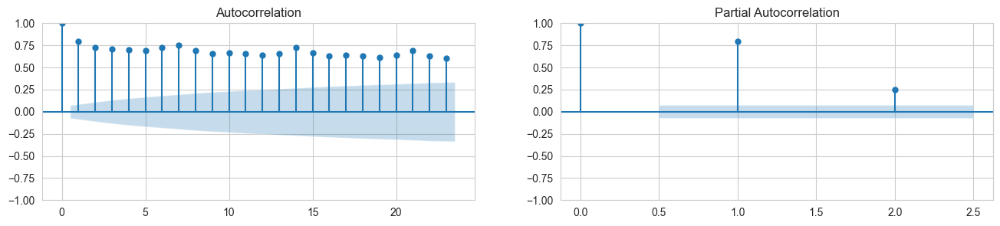

In [184]:
# Draw Plot
fig, axes = plt.subplots(1,2,figsize=(16,3), dpi= 100)
plot_acf(season_dtotal.seasonal.tolist(), lags=23, ax=axes[0])
plot_pacf(season_dtotal.seasonal.tolist(), lags=2, ax=axes[1])

Plot lags

Text(0.5, 1.0, 'Lag2')

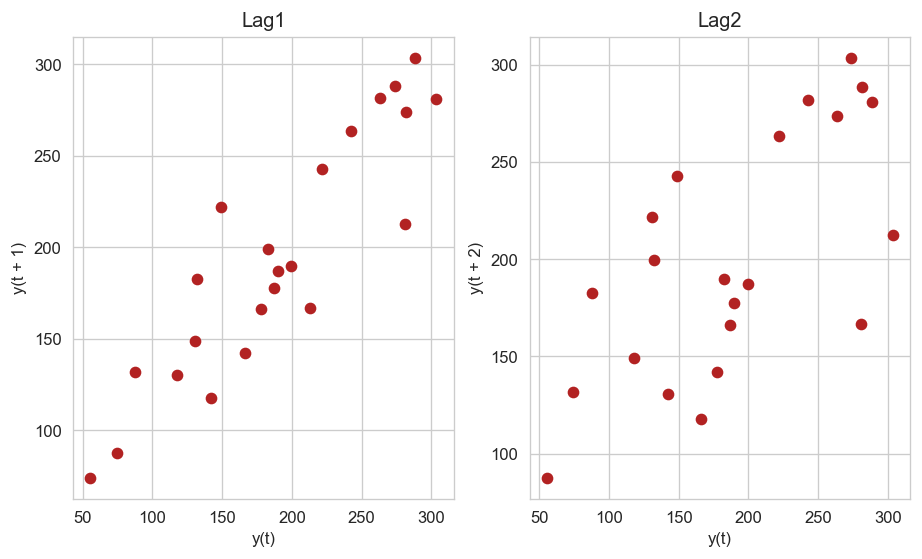

In [71]:
from pandas.plotting import lag_plot
fig=plt.subplot2grid((1,2),(0,0))
lag_plot(df3.cnt, lag=1, c='firebrick')
plt.title('Lag1')
fig=plt.subplot2grid((1,2),(0,1))
lag_plot(df3.cnt, lag=2, c='firebrick')
plt.title('Lag2')


Text(0.5, 1.0, 'Lag2')

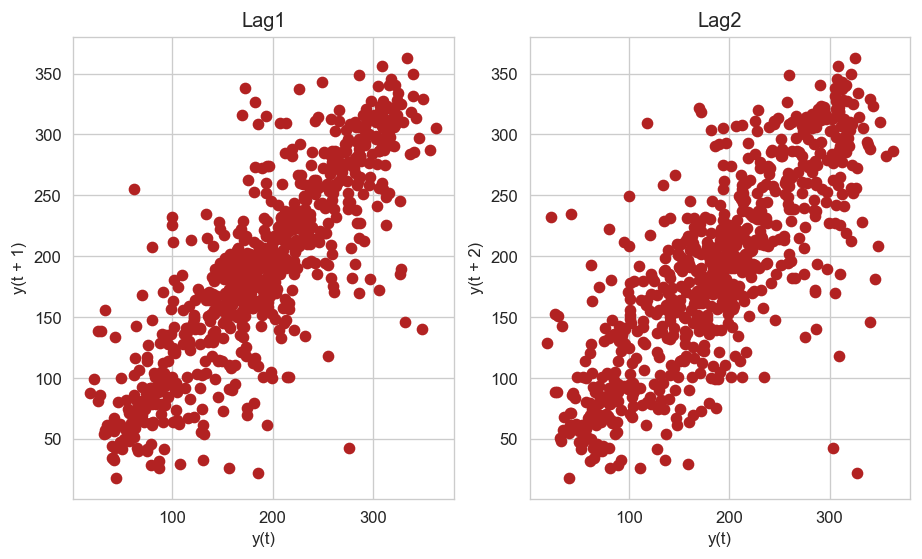

In [186]:
from pandas.plotting import lag_plot
fig=plt.subplot2grid((1,2),(0,0))
lag_plot(df0.cnt, lag=1, c='firebrick')
plt.title('Lag1')
fig=plt.subplot2grid((1,2),(0,1))
lag_plot(df0.cnt, lag=2, c='firebrick')
plt.title('Lag2')

Check for predictibility using appromate Entropy. High entropy means no predictibility

In [73]:
def ApEn(U, m, r):
    """Compute Aproximate entropy"""
    def _maxdist(x_i, x_j):
        return max([abs(ua - va) for ua, va in zip(x_i, x_j)])

    def _phi(m):
        x = [[U[j] for j in range(i, i + m - 1 + 1)] for i in range(N - m + 1)]
        C = [len([1 for x_j in x if _maxdist(x_i, x_j) <= r]) / (N - m + 1.0) for x_i in x]
        return (N - m + 1.0)**(-1) * sum(np.log(C))

    N = len(U)
    return abs(_phi(m+1) - _phi(m))

print(ApEn(df3.cnt, m=2, r=0.2*np.std(df3.cnt)))     

0.0868752104822379


In [187]:
def ApEn(U, m, r):
    """Compute Aproximate entropy"""
    def _maxdist(x_i, x_j):
        return max([abs(ua - va) for ua, va in zip(x_i, x_j)])

    def _phi(m):
        x = [[U[j] for j in range(i, i + m - 1 + 1)] for i in range(N - m + 1)]
        C = [len([1 for x_j in x if _maxdist(x_i, x_j) <= r]) / (N - m + 1.0) for x_i in x]
        return (N - m + 1.0)**(-1) * sum(np.log(C))

    N = len(U)
    return abs(_phi(m+1) - _phi(m))

print(ApEn(df0.cnt, m=2, r=0.2*np.std(df0.cnt)))   

1.1875738582021698


Check predictibility for season_d (df3 after removing trend and seasonality) and trend_d (removing only trend)

In [188]:
print(ApEn(season_dm.seasonal, m=2, r=0.2*np.std(season_dm.seasonal))) 

0.1826452647678769


In [189]:
print(ApEn(season_dtotal.seasonal, m=2, r=0.2*np.std(season_dtotal.seasonal))) 

1.2732085319265485


In [190]:
print(ApEn(trend_dm.trend, m=2, r=0.2*np.std(trend_dm.trend))) 

0.04445176257083583


In [191]:
print(ApEn(trend_dtotal.trend, m=2, r=0.2*np.std(trend_dtotal.trend))) 

1.4306642158368303


Remove noise from the data by smoothen it. Here I use two methods: Lowss and Moving avarage

/var/folders/nm/btrww2_94pncl34mb0yt49j80000gn/T/ipykernel_99258/1956618372.py:13: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



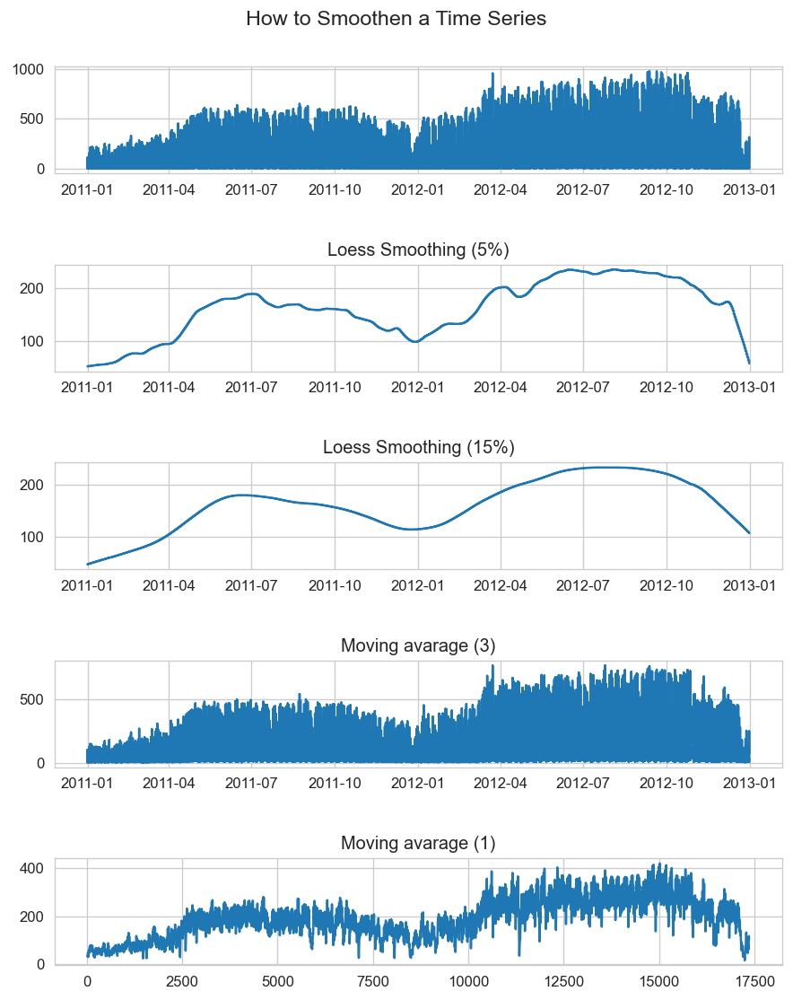

In [76]:
from statsmodels.nonparametric.smoothers_lowess import lowess

# Loss Smoothing (5% and 15%)
df_smooth1=pd.DataFrame(lowess(df1.cnt, np.arange(len(df1.cnt)), frac=0.05)[:, 1], index=df1.index, columns=['cnt'])
df_smooth2=pd.DataFrame(lowess(df1.cnt, np.arange(len(df1.cnt)), frac=0.15)[:, 1], index=df1.index, columns=['cnt'])
# Moving avarage
df_smooth3=df1.cnt.rolling(3, center=True, closed='both').mean().dropna()
df_smooth4=df1.cnt.rolling(30, center=True, closed='both').mean().dropna()

# plot
fig=plt.figure(figsize=(8,10))
plt.title('Original Time series')
plt.subplot2grid((5,1),(0,0))
plt.plot(df1['dteday'],df1['cnt'])
plt.subplot2grid((5,1),(1,0))
plt.title('Loess Smoothing (5%)')

plt.plot(df1['dteday'],df_smooth1['cnt'])
plt.subplot2grid((5,1),(2,0))
plt.title('Loess Smoothing (15%)')

plt.plot(df1['dteday'],df_smooth2['cnt'])
plt.subplot2grid((5,1),(3,0))
plt.title('Moving avarage (3)')
plt.plot(df1['dteday'][df1.index !=0 ],df_smooth3.iloc[:])
plt.subplot2grid((5,1),(4,0))
plt.title('Moving avarage (1)')
plt.plot(df_smooth4.iloc[:])
fig.suptitle('How to Smoothen a Time Series', y=0.95, fontsize=14)
plt.tight_layout(pad=3)
plt.show()

Test  if month time series will be useful to forecast cnt. The null hypothesys is it is not. If p is less than significant level (0.05), then we can reject it. 

In [ ]:
from statsmodels.tsa.stattools import grangercausalitytests
grangercausalitytests(df1[['cnt', 'month']], maxlag=2)



Granger Causality
number of lags (no zero) 1
ssr based F test:         F=21.7126 , p=0.0000  , df_denom=17375, df_num=1
ssr based chi2 test:   chi2=21.7163 , p=0.0000  , df=1
likelihood ratio test: chi2=21.7028 , p=0.0000  , df=1
parameter F test:         F=21.7126 , p=0.0000  , df_denom=17375, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=26.6561 , p=0.0000  , df_denom=17372, df_num=2
ssr based chi2 test:   chi2=53.3275 , p=0.0000  , df=2
likelihood ratio test: chi2=53.2458 , p=0.0000  , df=2
parameter F test:         F=26.6561 , p=0.0000  , df_denom=17372, df_num=2


{1: ({'ssr_ftest': (21.71256730053811, 3.1905932367319326e-06, 17375.0, 1),
   'ssr_chi2test': (21.716316233021658, 3.1609134778391832e-06, 1),
   'lrtest': (21.702758692670614, 3.183331662245552e-06, 1),
   'params_ftest': (21.712567300543373, 3.1905932367257434e-06, 17375.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (26.656072194457828, 2.7614813012417015e-12, 17372.0, 2),
   'ssr_chi2test': (53.32748866257123, 2.630770540987107e-12, 2),
   'lrtest': (53.24582853069296, 2.740408099087308e-12, 2),
   'params_ftest': (26.656072194481155, 2.7614813011772153e-12, 17372.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])])}

In [ ]:
from statsmodels.tsa.stattools import grangercausalitytests
grangercausalitytests(df1[['cnt', 'hr']], maxlag=2)



Granger Causality
number of lags (no zero) 1
ssr based F test:         F=155.7099, p=0.0000  , df_denom=17375, df_num=1
ssr based chi2 test:   chi2=155.7368, p=0.0000  , df=1
likelihood ratio test: chi2=155.0431, p=0.0000  , df=1
parameter F test:         F=155.7099, p=0.0000  , df_denom=17375, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=64.9657 , p=0.0000  , df_denom=17372, df_num=2
ssr based chi2 test:   chi2=129.9689, p=0.0000  , df=2
likelihood ratio test: chi2=129.4852, p=0.0000  , df=2
parameter F test:         F=64.9657 , p=0.0000  , df_denom=17372, df_num=2


{1: ({'ssr_ftest': (155.7099194561374, 1.3918610079926473e-35, 17375.0, 1),
   'ssr_chi2test': (155.73680462208665, 9.664552694085914e-36, 1),
   'lrtest': (155.04311102829524, 1.3701644888675088e-35, 1),
   'params_ftest': (155.70991945613872, 1.3918610079926473e-35, 17375.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (64.96572766718364, 7.775567375923882e-29, 17372.0, 2),
   'ssr_chi2test': (129.9688521382282, 5.992697398519234e-29, 2),
   'lrtest': (129.4852201792528, 7.632058560980023e-29, 2),
   'params_ftest': (64.96572766716454, 7.775567376082225e-29, 17372.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])])}

Let's make the whole time series stationary by differencing method

In [203]:
df0_stationary=df0.diff().dropna()
df0_stationary.describe()

,instant,yr,mnth,hr,weekday,workingday,temp,atemp,hum,windspeed,casual,registered,cnt,real_temp,real_atemp,real_hum,real_windspeed,month,year,day
count,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000
mean,23.773973,0.001370,0.015068,0.000000,-0.006849,0.001370,-0.000176,-0.000192,-0.000313,-0.000008,0.006164,0.093379,0.099543,-0.008263,-0.012670,-0.031279,-0.000514,0.015068,0.001370,0.041096
std,1.123514,0.037012,0.442642,1.068829,2.458145,0.545588,0.058437,0.059432,0.138325,0.089995,24.505243,37.397433,44.314247,2.746558,3.922525,13.832474,6.029651,0.442642,0.037012,5.321846
min,6.000000,0.000000,-11.000000,-11.500000,-6.000000,-1.000000,-0.202500,-0.412287,-0.775417,-0.284228,-100.875000,-148.083333,-233.208333,-9.517500,-27.210975,-77.541667,-19.043257,-11.000000,0.000000,-30.000000
25%,24.000000,0.000000,0.000000,0.000000,1.000000,0.000000,-0.030833,-0.028880,-0.071562,-0.053485,-8.581069,-19.187500,-19.260417,-1.449167,-1.906094,-7.156250,-3.583523,0.000000,0.000000,1.000000
50%,24.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.003333,0.004412,0.001875,-0.002790,0.255435,1.832428,2.562500,0.156667,0.291225,0.187500,-0.186902,0.000000,0.000000,1.000000
75%,24.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.033333,0.032213,0.080625,0.053329,8.489583,19.223732,19.729167,1.566667,2.126025,8.062500,3.573045,0.000000,0.000000,1.000000
max,24.000000,1.000000,1.000000,18.000000,1.000000,1.000000,0.195000,0.375671,0.649565,0.316542,108.625000,129.208333,192.996732,9.165000,24.794275,64.956522,21.208292,1.000000,1.000000,1.000000


Plot the additive components

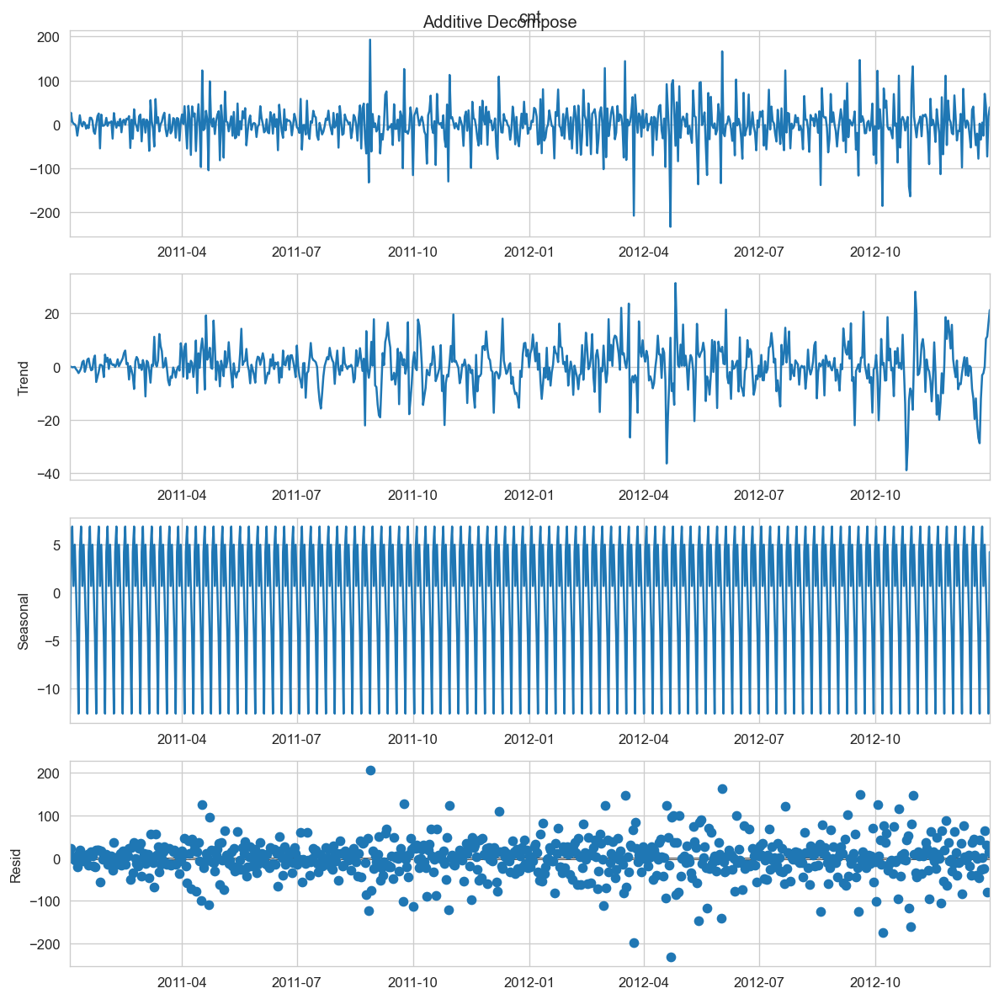

In [204]:
# Multiplicative Decomposition 
#result_mul_total = seasonal_decompose(df0_stationary['cnt'], model='multiplicative', extrapolate_trend='freq')

# Additive Decomposition
result_add_total = seasonal_decompose(df0_stationary['cnt'], model='additive', extrapolate_trend='freq')

# Plot
plt.rcParams.update({'figure.figsize': (10,10)})
#result_mul_total.plot().suptitle('Multiplicative Decompose', fontsize=12)
result_add_total.plot().suptitle('Additive Decompose', fontsize=12)
plt.show()

Let's test if the series is stationary now

In [207]:
# ADF Test
result = adfuller(df0_stationary.cnt.values, autolag='AIC')
print(f'ADF Statistic: {result[0]}')
print(f'p-value: {result[1]}')
for key, value in result[4].items():
    print('Critial Values:')
    print(f'   {key}, {value}')

# KPSS Test
result = kpss(df0_stationary.cnt.values, regression='c')
print('\nKPSS Statistic: %f' % result[0])
print('p-value: %f' % result[1])
for key, value in result[3].items():
    print('Critial Values:')
    print(f'   {key}, {value}')

ADF Statistic: -11.732608099023587
p-value: 1.3306094090476593e-21
Critial Values:
   1%, -3.439503230053971
Critial Values:
   5%, -2.8655794463678346
Critial Values:
   10%, -2.5689210707289982

KPSS Statistic: 0.229741
p-value: 0.100000
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/tsa/stattools.py:2022: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.


